<a href="https://colab.research.google.com/github/daffaalfajrii1/Diabetic-Retinophaty-EfficiennetB7/blob/main/Diabetic_R.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DIABETIC RETINOPATHY 24 BIT IMAGE

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True) 

Mounted at /content/drive


In [ ]:
#Load dataset dari Kaggle
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
from google.colab import files
files.upload()
!cp kaggle.json ~/.kaggle/
!kaggle datasets download -d aitude/aptos-augmented-images
!ls

Saving kaggle.json to kaggle.json
100% 2.75G/2.77G [01:19<00:00, 49.4MB/s]
100% 2.77G/2.77G [01:19<00:00, 37.5MB/s]
aptos-augmented-images.zip  drive  kaggle.json	sample_data


In [ ]:
!unzip /content/aptos-augmented-images.zip

Streaming output truncated to the last 5000 lines.
  inflating: aptos-augmented-images/aptos-augmented-images/2/7dd834c00140.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7de7beaf5e9f.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7dee6bf8b9c1.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7df4bb0f86f7.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e0dc2e2fa5e.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e6e90a93aa5.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e9458de5707.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7ea51381ff6a.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7ec1ffe8220b.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f17e6883f9f.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f1f77407d32.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f27681d

In [ ]:
import os



In [ ]:
!mkdir citra

In [ ]:
!mkdir /content/citra/0NoDR
!mkdir /content/citra/1Mild
!mkdir /content/citra/2Moderate
!mkdir /content/citra/3Severe
!mkdir /content/citra/4ProliferativeDR

In [ ]:
# #train move
import shutil
import os

source_dir = '/content/aptos-augmented-images/aptos-augmented-images/0'
target_dir = '/content/citra/0NoDR'
source_dir1 = '/content/aptos-augmented-images/aptos-augmented-images/1'
target_dir1 = '/content/citra/1Mild'
source_dir2 = '/content/aptos-augmented-images/aptos-augmented-images/2'
target_dir2 = '/content/citra/2Moderate'
source_dir3 = '/content/aptos-augmented-images/aptos-augmented-images/3'
target_dir3 = '/content/citra/3Severe'
source_dir4 = '/content/aptos-augmented-images/aptos-augmented-images/4'
target_dir4 = '/content/citra/4ProliferativeDR'
    
file_names = os.listdir(source_dir)
file_names1 = os.listdir(source_dir1)
file_names2 = os.listdir(source_dir2)
file_names3 = os.listdir(source_dir3)
file_names4 = os.listdir(source_dir4)
    
for file_name in file_names:
    shutil.move(os.path.join(source_dir, file_name), target_dir)

for file_names1 in file_names1:
    shutil.move(os.path.join(source_dir1, file_names1), target_dir1)

for file_names2 in file_names2:
    shutil.move(os.path.join(source_dir2, file_names2), target_dir2)

for file_names3 in file_names3:
    shutil.move(os.path.join(source_dir3, file_names3), target_dir3)

for file_names4 in file_names4:
    shutil.move(os.path.join(source_dir4, file_names4), target_dir4)

In [ ]:
test=os.listdir('/content/citra')
test0=os.listdir('/content/citra/0NoDR')
test1=os.listdir('/content/aptos-augmented-images/2')
test2=os.listdir('/content/aptos-augmented-images/2')
test3=os.listdir('/content/aptos-augmented-images/3')
test4=os.listdir('/content/aptos-augmented-images/4')

print("Total Folder: ",len(test))
print("Class 0: ",len(test0))
print("Class 1: ",len(test1))
print("Class 2: ",len(test2))
print("Class 3: ",len(test3))
print("Class 4: ",len(test4))

Total Folder:  5
Class 0:  2000
Class 1:  2000
Class 2:  2000
Class 3:  2000
Class 4:  2000


In [ ]:
import os
import numpy as np
import shutil
import pandas as pd


def train_test_split():
    print("########### Train Test Val Script started ###########")
   
    root_dir = '/content/citra_baru'
    classes_dir = ['0NoDR', '1Mild', '2Moderate', '3Severe', '4ProliferativeDR']

    processed_dir = '/content/citra'

    test_ratio = 0.10
    val_ratio = 0.20

    for cls in classes_dir:
        # Creating partitions of the data after shuffeling
        print("$$$$$$$ Class Name " + cls + " $$$$$$$")
        src = processed_dir +"/" + cls  # Folder to copy images from

        allFileNames = os.listdir(src)
        np.random.shuffle(allFileNames)
        train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                                  [int(len(allFileNames) * (1 - (test_ratio + val_ratio))),
                                                                   int(len(allFileNames) * (1 - test_ratio)),
                                                                   ])

        train_FileNames = [src + '/' + name for name in train_FileNames.tolist()]
        val_FileNames = [src + '/' + name for name in val_FileNames.tolist()]
        test_FileNames = [src + '/' + name for name in test_FileNames.tolist()]

        print('Total images: '+ str(len(allFileNames)))
        print('Training: '+ str(len(train_FileNames)))
        print('Validation: '+  str(len(val_FileNames)))
        print('Testing: '+ str(len(test_FileNames)))

        # # Creating Train / Val / Test folders (One time use)
        os.makedirs(root_dir + '/train/' + cls)
        os.makedirs(root_dir + '/val/' + cls)
        os.makedirs(root_dir + '/test/' + cls)

        # Copy-pasting images
        for name in train_FileNames:
            shutil.copy(name, root_dir + '/train/' + cls)

        for name in val_FileNames:
            shutil.copy(name, root_dir + '/val/' + cls)

        for name in test_FileNames:
            shutil.copy(name, root_dir + '/test/' + cls)

    print("########### Train Test Val Script Ended ###########")

train_test_split()

########### Train Test Val Script started ###########
$$$$$$$ Class Name 0NoDR $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 1Mild $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 2Moderate $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 3Severe $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 4ProliferativeDR $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
########### Train Test Val Script Ended ###########


## Percobaan 1 (Batch Size =8, learning rate=0.0001, epoh=30)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 8
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 30

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

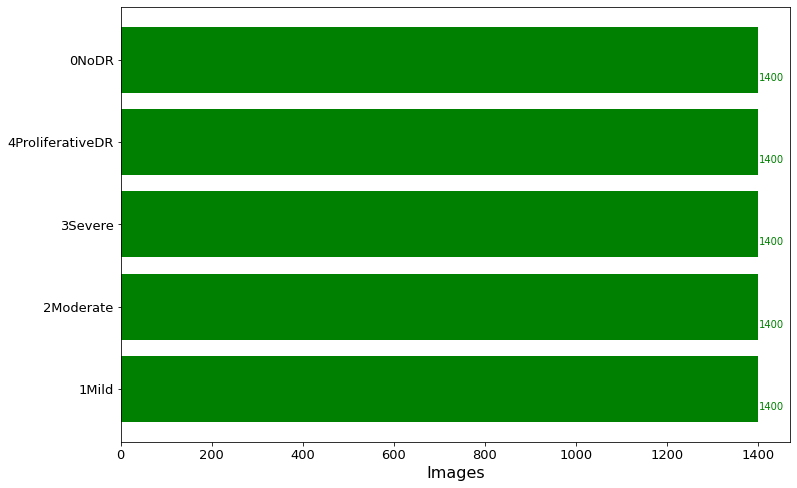

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

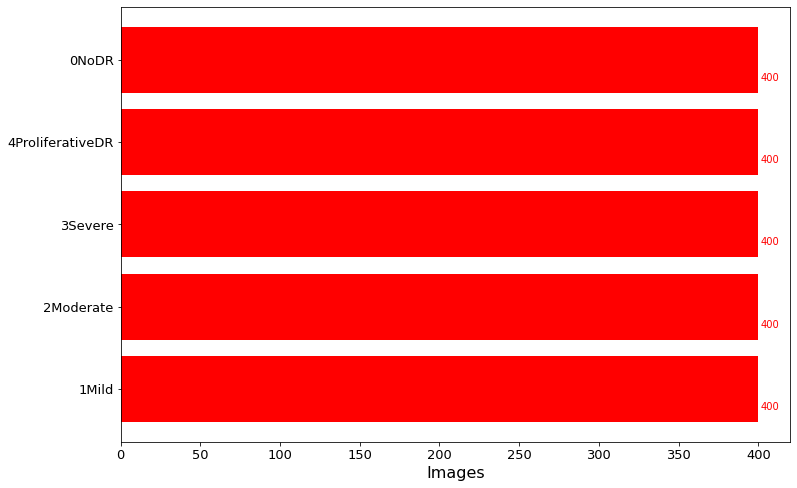

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

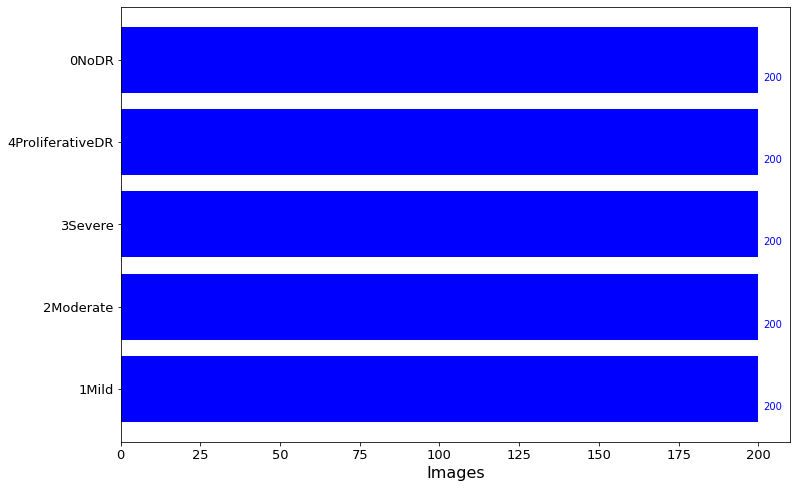

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_names = train_data.class_indices
print(class_names)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


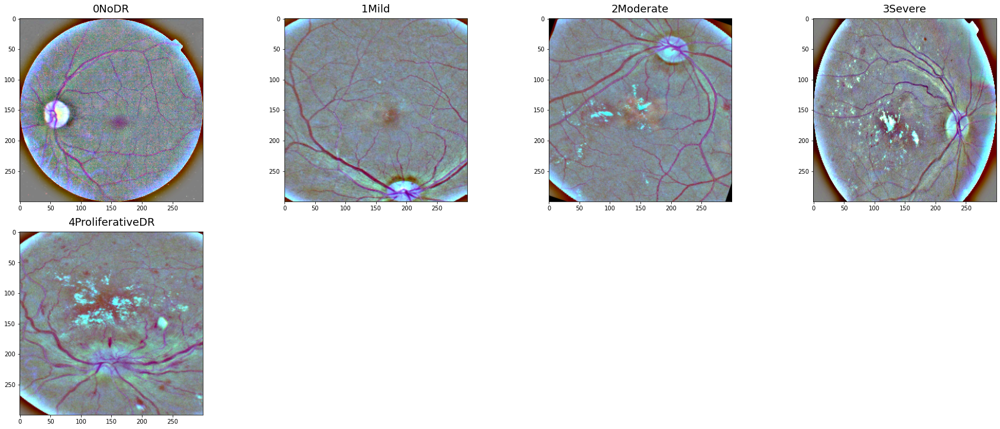

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for dr_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap folder DR
    dr_items = os.listdir(train_folder + '/' + dr_folder) # Masukkan dr items
    dr_selected = np.random.choice(dr_items)
    images.append(os.path.join(train_folder,dr_folder,dr_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 4.5 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.5 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 5 class 
        ], name = "custom_ef_model")


258449408/258434480 [==============================] - 14s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_ef_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)             

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.0001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy']  
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 30 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/30
875/875 [==============================] - 360s 369ms/step - loss: 1.1453 - accuracy: 0.5286 - val_loss: 0.4842 - val_accuracy: 0.8320
Epoch 2/30
875/875 [==============================] - 319s 365ms/step - loss: 0.9133 - accuracy: 0.6399 - val_loss: 0.4737 - val_accuracy: 0.8260
Epoch 3/30
875/875 [==============================] - 319s 365ms/step - loss: 0.8001 - accuracy: 0.6810 - val_loss: 0.4482 - val_accuracy: 0.8300
Epoch 4/30
875/875 [==============================] - 319s 365ms/step - loss: 0.7521 - accuracy: 0.7063 - val_loss: 0.3515 - val_accuracy: 0.8650
Epoch 5/30
875/875 [==============================] - 320s 365ms/step - loss: 0.6739 - accuracy: 0.7437 - val_loss: 0.3066 - val_accuracy: 0.8910
Epoch 6/30
875/875 [==============================] - 320s 366ms/step - loss: 0.6227 - accuracy: 0.7627 - val_loss: 0.2913 - val_accuracy: 0.8950
Epoch 7/30
875/875 [==============================] - 319s 365ms/step - loss: 0.5566 - accuracy: 0.7897 - val_loss: 0.3737 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

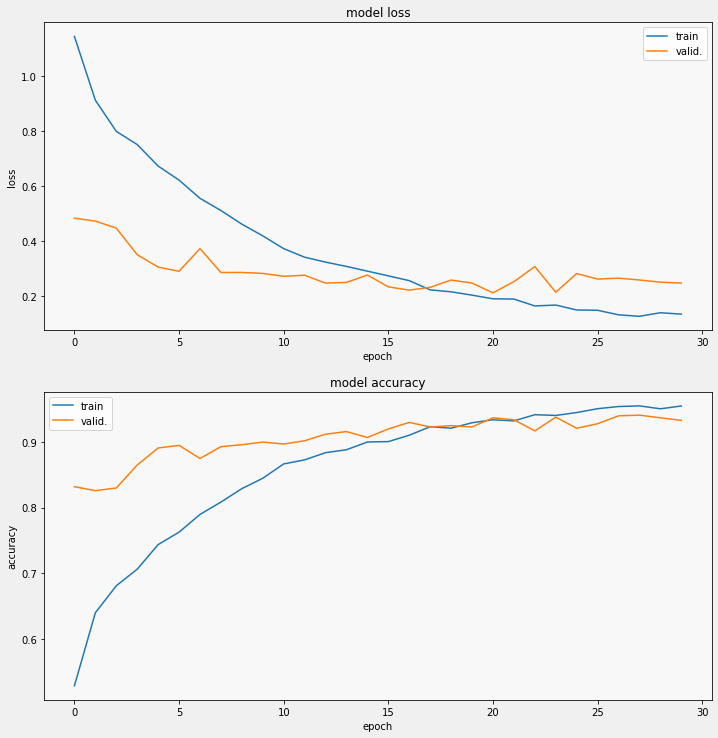

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.99      0.99      0.99       200
           1Mild       0.96      0.95      0.96       200
       2Moderate       0.96      0.97      0.97       200
         3Severe       0.93      0.99      0.96       200
4ProliferativeDR       0.97      0.91      0.94       200

        accuracy                           0.96      1000
       macro avg       0.96      0.96      0.96      1000
    weighted avg       0.96      0.96      0.96      1000



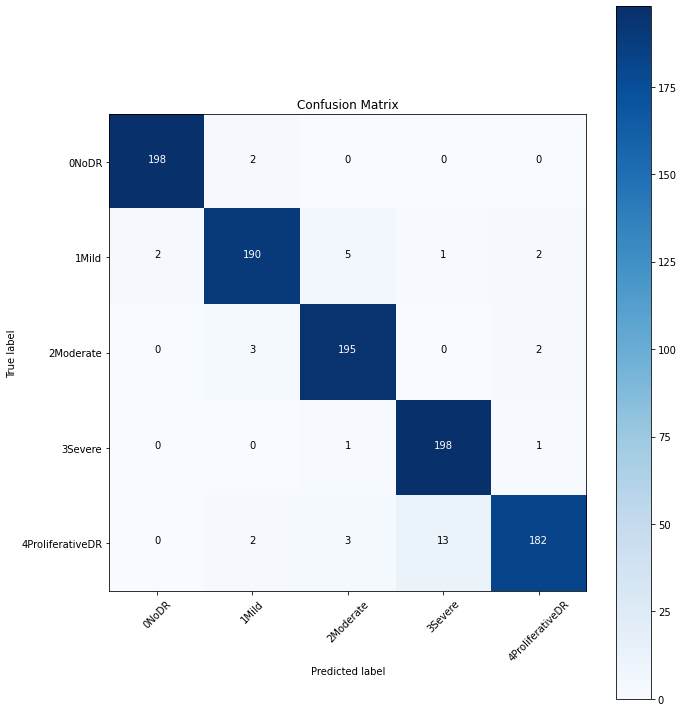

In [ ]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = loaded_model.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

## Percobaan 2 (Batch Size =16, learning rate=0.00001, epoch=60)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 16
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 60

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

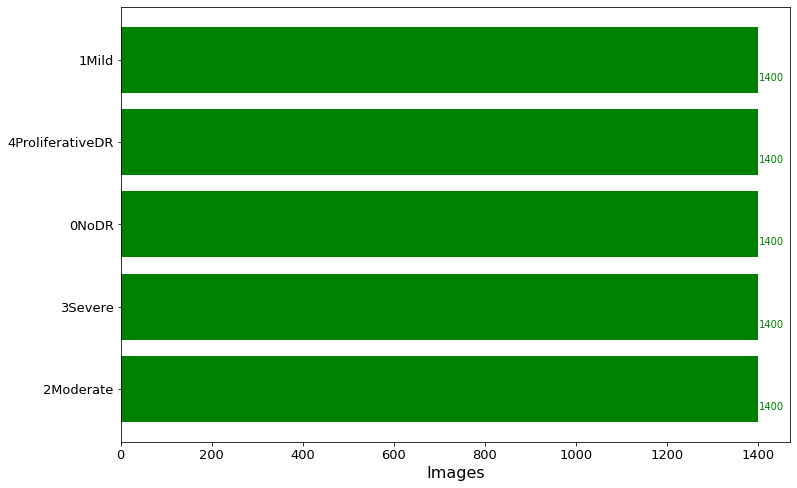

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

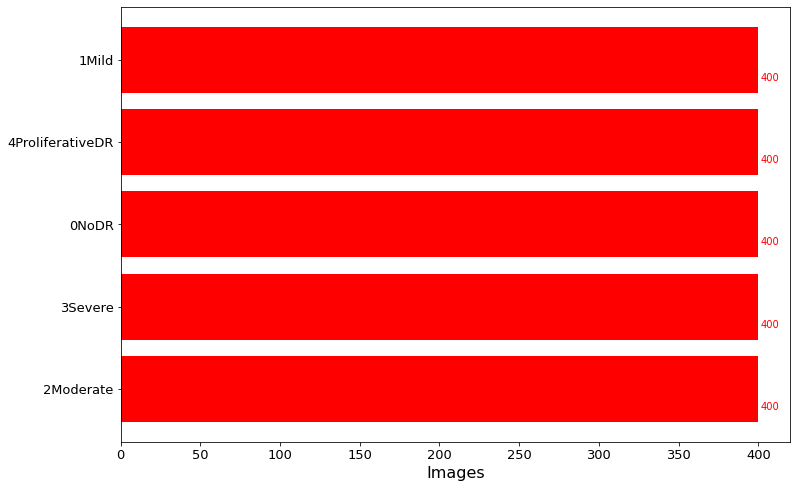

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

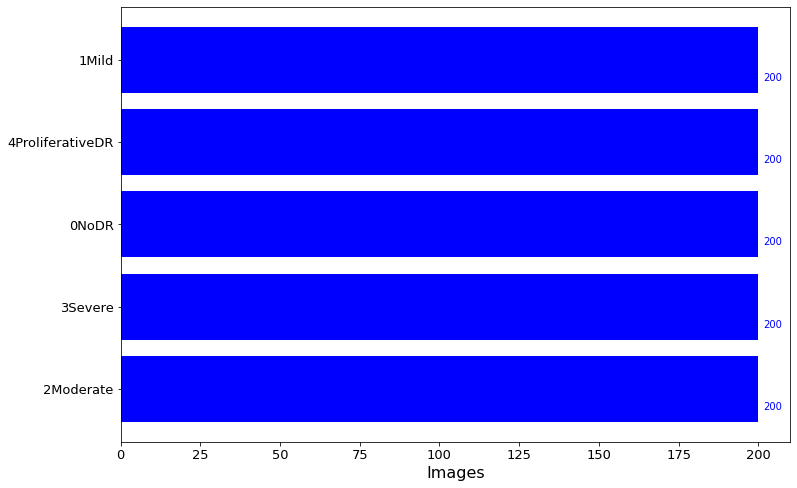

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

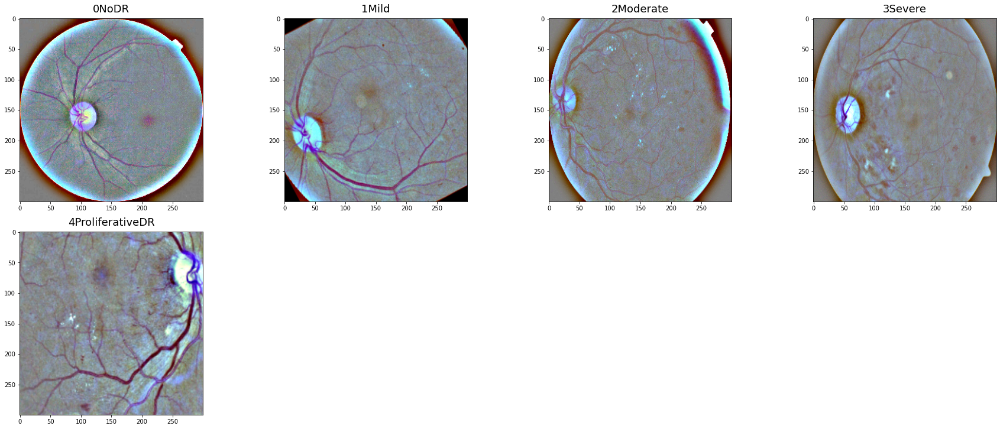

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for dr_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap dr folder yang didefinisikan sebagai train folder
    dr_items = os.listdir(train_folder + '/' + dr_folder) # Masukkan dr items
    dr_selected = np.random.choice(dr_items)
    images.append(os.path.join(train_folder,dr_folder,dr_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_name = train_data.class_indices
print(class_name)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 3.1 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.2 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 15 class 
        ], name = "custom_ef_model")


258449408/258434480 [==============================] - 4s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_ef_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)             

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.00001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy']  
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 60 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/60
437/437 [==============================] - 445s 921ms/step - loss: 1.5273 - accuracy: 0.3270 - val_loss: 1.0280 - val_accuracy: 0.5754
Epoch 2/60
437/437 [==============================] - 399s 911ms/step - loss: 1.3016 - accuracy: 0.4493 - val_loss: 0.9142 - val_accuracy: 0.6538
Epoch 3/60
437/437 [==============================] - 399s 911ms/step - loss: 1.1842 - accuracy: 0.5104 - val_loss: 0.7888 - val_accuracy: 0.7192
Epoch 4/60
437/437 [==============================] - 398s 910ms/step - loss: 1.0849 - accuracy: 0.5596 - val_loss: 0.6845 - val_accuracy: 0.7520
Epoch 5/60
437/437 [==============================] - 399s 912ms/step - loss: 1.0317 - accuracy: 0.5836 - val_loss: 0.6097 - val_accuracy: 0.7758
Epoch 6/60
437/437 [==============================] - 399s 911ms/step - loss: 0.9788 - accuracy: 0.5999 - val_loss: 0.5557 - val_accuracy: 0.8006
Epoch 7/60
437/437 [==============================] - 399s 912ms/step - loss: 0.9450 - accuracy: 0.6167 - val_loss: 0.5254 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

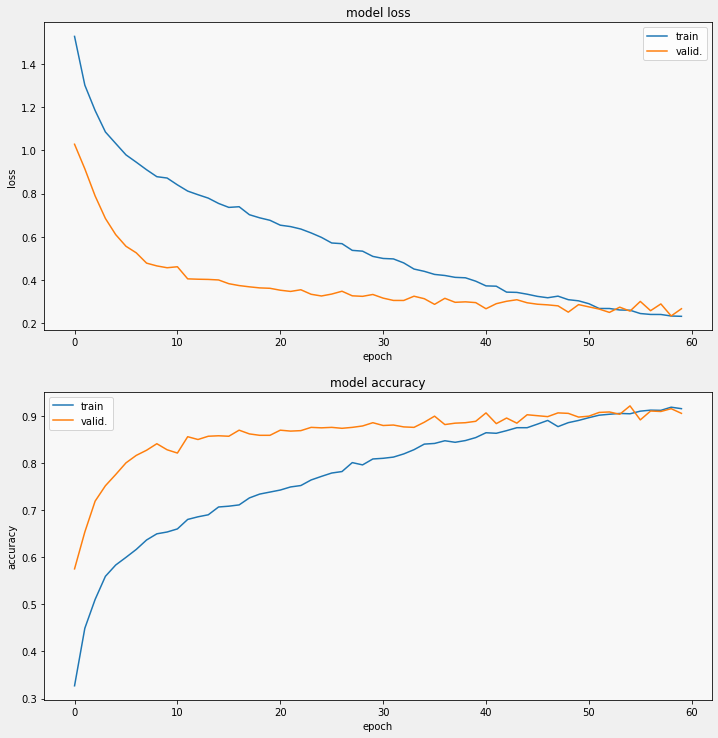

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/Model1_DR.h5')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.


Confusion Matrix
Normalized confusion matrix
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.96      0.98      0.97       200
           1Mild       0.87      0.91      0.89       200
       2Moderate       0.82      0.79      0.80       200
         3Severe       0.89      0.90      0.89       200
4ProliferativeDR       0.89      0.85      0.87       200

        accuracy                           0.89      1000
       macro avg       0.89      0.89      0.89      1000
    weighted avg       0.89      0.89      0.89      1000



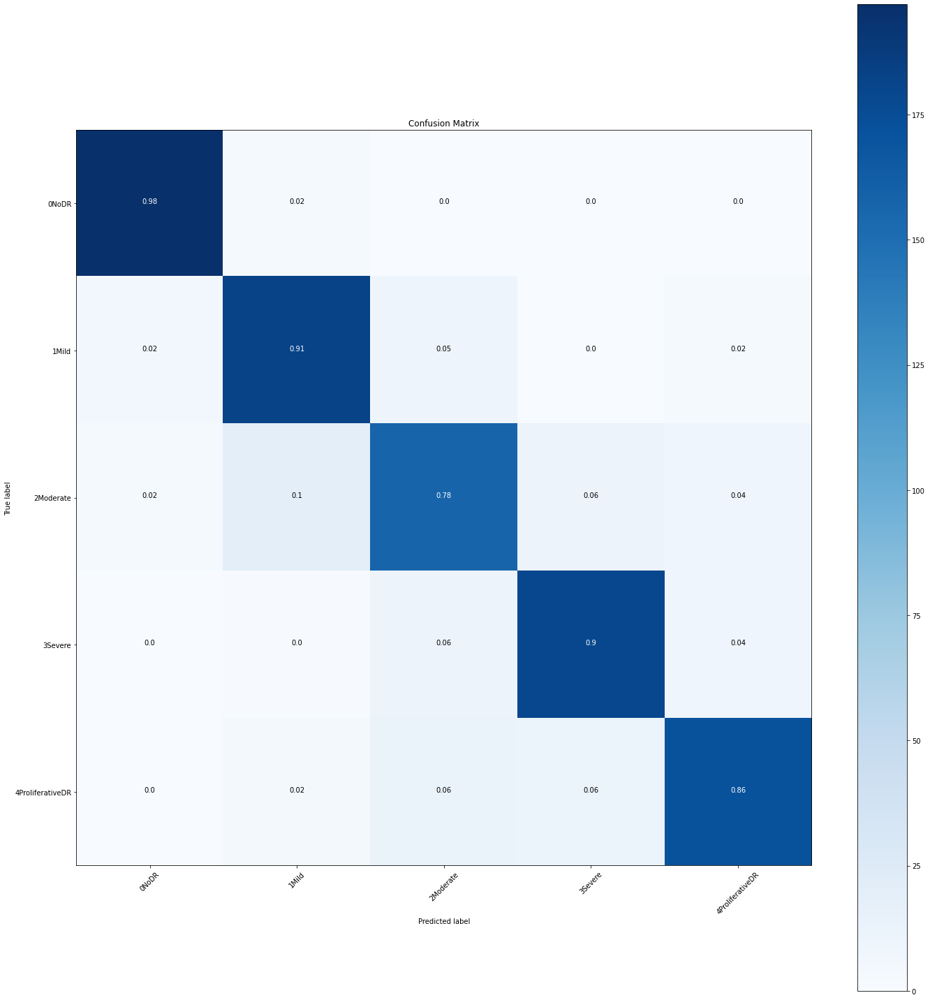

In [ ]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
       # cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
       # cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_ef_custom.predict_generator(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

In [ ]:
from google.colab.patches import cv2_imshow
from PIL import Image
import os

---CM without Normaliztion---


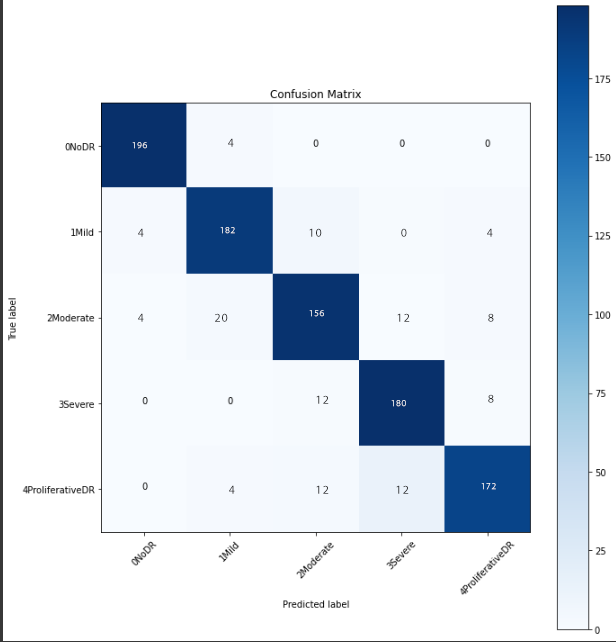

In [ ]:
## Testing Image
import cv2
img = cv2.imread('/content/SavefligCM.png', cv2.IMREAD_UNCHANGED)
print ("---CM without Normaliztion---")
cv2_imshow(img)


## Percobaan 3 (Batch Size =18, learning rate=0.000001, epoch=90)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 18
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 90

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

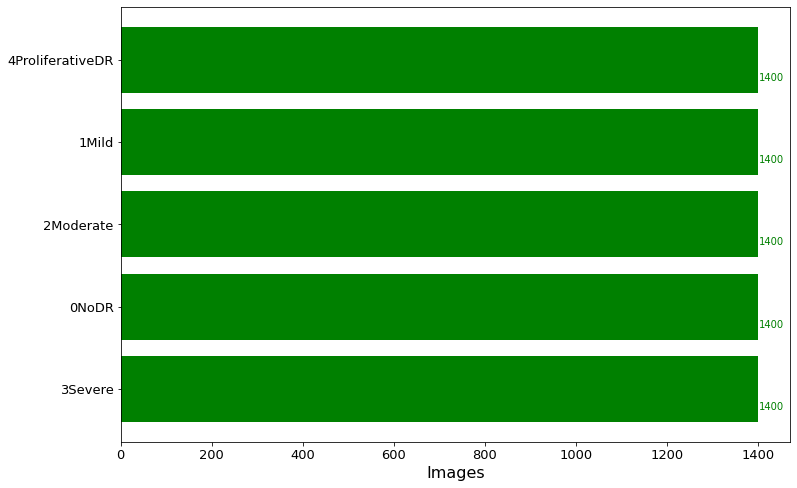

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

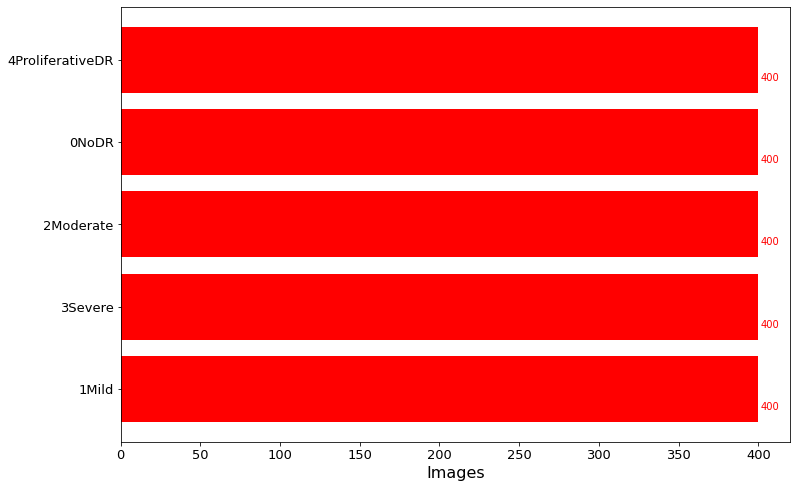

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

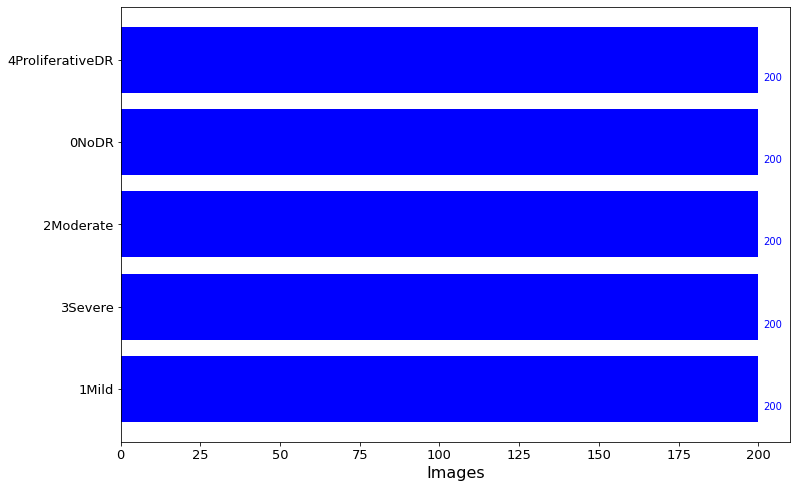

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

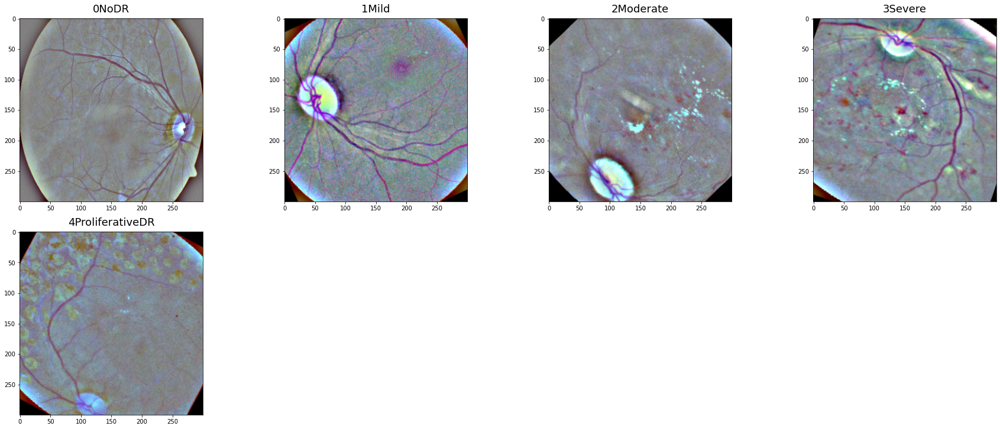

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for dr_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap dr folder yang didefinisikan sebagai train folder
    dr_items = os.listdir(train_folder + '/' + dr_folder) # Masukkan dr items
    dr_selected = np.random.choice(dr_items)
    images.append(os.path.join(train_folder,dr_folder,dr_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_name = train_data.class_indices
print(class_name)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 3.5 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.2 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 15 class 
        ], name = "custom_eff_model")


258449408/258434480 [==============================] - 21s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_eff_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)            

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.000001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy'],
                               
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 90 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/90
388/388 [==============================] - 335s 731ms/step - loss: 1.6985 - accuracy: 0.2283 - val_loss: 1.3724 - val_accuracy: 0.5367
Epoch 2/90
388/388 [==============================] - 279s 717ms/step - loss: 1.6483 - accuracy: 0.2579 - val_loss: 1.3176 - val_accuracy: 0.6270
Epoch 3/90
388/388 [==============================] - 278s 715ms/step - loss: 1.5965 - accuracy: 0.2940 - val_loss: 1.2696 - val_accuracy: 0.6399
Epoch 4/90
388/388 [==============================] - 278s 715ms/step - loss: 1.5596 - accuracy: 0.3113 - val_loss: 1.2178 - val_accuracy: 0.6538
Epoch 5/90
388/388 [==============================] - 278s 715ms/step - loss: 1.5133 - accuracy: 0.3347 - val_loss: 1.1692 - val_accuracy: 0.6567
Epoch 6/90
388/388 [==============================] - 278s 715ms/step - loss: 1.4843 - accuracy: 0.3554 - val_loss: 1.1226 - val_accuracy: 0.6597
Epoch 7/90
388/388 [==============================] - 279s 716ms/step - loss: 1.4527 - accuracy: 0.3690 - val_loss: 1.0856 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

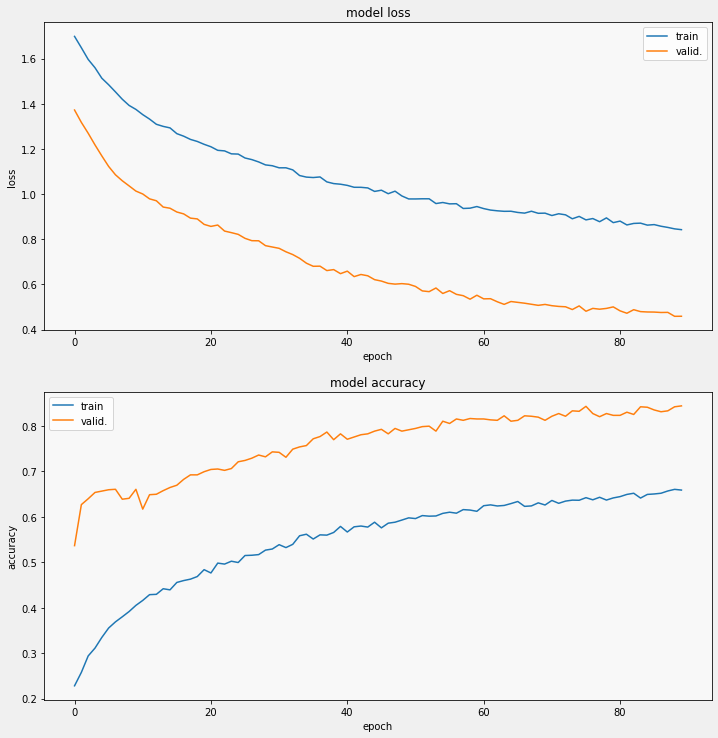

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
model = tf.keras.models.load_model('/content/drive/MyDrive/Model3_efficiennet.h5')

Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.93      0.99      0.96       200
           1Mild       0.69      0.75      0.72       200
       2Moderate       0.63      0.80      0.70       200
         3Severe       0.72      0.64      0.68       200
4ProliferativeDR       0.68      0.47      0.56       200

        accuracy                           0.73      1000
       macro avg       0.73      0.73      0.72      1000
    weighted avg       0.73      0.73      0.72      1000



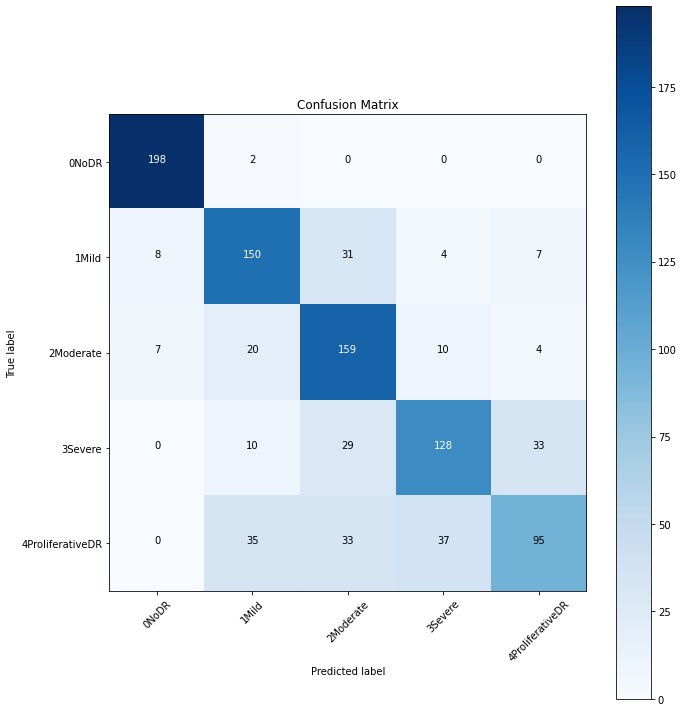

In [ ]:

def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

# DIABETIC RETINOPATHY 8 BIT IMAGE

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True) 

Mounted at /content/drive


In [ ]:
#Load dataset dari Kaggle
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
from google.colab import files
files.upload()
!cp kaggle.json ~/.kaggle/
!kaggle datasets download -d aitude/aptos-augmented-images
!ls

Saving kaggle.json to kaggle.json
 99% 2.74G/2.77G [01:41<00:00, 44.1MB/s]
100% 2.77G/2.77G [01:41<00:00, 29.1MB/s]
aptos-augmented-images.zip  drive  kaggle.json	sample_data


In [ ]:
!unzip /content/aptos-augmented-images.zip

Output streaming akan dipotong hingga 5000 baris terakhir.
  inflating: aptos-augmented-images/aptos-augmented-images/2/7dd834c00140.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7de7beaf5e9f.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7dee6bf8b9c1.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7df4bb0f86f7.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e0dc2e2fa5e.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e6e90a93aa5.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e9458de5707.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7ea51381ff6a.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7ec1ffe8220b.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f17e6883f9f.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f1f77407d32.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/

In [ ]:
import os

In [ ]:
!mkdir citra

In [ ]:
!mkdir /content/citra/0NoDR
!mkdir /content/citra/1Mild
!mkdir /content/citra/2Moderate
!mkdir /content/citra/3Severe
!mkdir /content/citra/4ProliferativeDR

In [ ]:
# #train move
import shutil
import os

source_dir = '/content/aptos-augmented-images/aptos-augmented-images/0'
target_dir = '/content/citra/0NoDR'
source_dir1 = '/content/aptos-augmented-images/aptos-augmented-images/1'
target_dir1 = '/content/citra/1Mild'
source_dir2 = '/content/aptos-augmented-images/aptos-augmented-images/2'
target_dir2 = '/content/citra/2Moderate'
source_dir3 = '/content/aptos-augmented-images/aptos-augmented-images/3'
target_dir3 = '/content/citra/3Severe'
source_dir4 = '/content/aptos-augmented-images/aptos-augmented-images/4'
target_dir4 = '/content/citra/4ProliferativeDR'
    
file_names = os.listdir(source_dir)
file_names1 = os.listdir(source_dir1)
file_names2 = os.listdir(source_dir2)
file_names3 = os.listdir(source_dir3)
file_names4 = os.listdir(source_dir4)
    
for file_name in file_names:
    shutil.move(os.path.join(source_dir, file_name), target_dir)

for file_names1 in file_names1:
    shutil.move(os.path.join(source_dir1, file_names1), target_dir1)

for file_names2 in file_names2:
    shutil.move(os.path.join(source_dir2, file_names2), target_dir2)

for file_names3 in file_names3:
    shutil.move(os.path.join(source_dir3, file_names3), target_dir3)

for file_names4 in file_names4:
    shutil.move(os.path.join(source_dir4, file_names4), target_dir4)

In [ ]:
!mkdir citra_konversi

In [ ]:
!mkdir /content/citra_konversi/0NoDR
!mkdir /content/citra_konversi/1Mild
!mkdir /content/citra_konversi/2Moderate
!mkdir /content/citra_konversi/3Severe
!mkdir /content/citra_konversi/4ProliferativeDR

In [ ]:
from google.colab.patches import cv2_imshow
from PIL import Image
import os

In [ ]:
#Konversi NoDR
base_dir_src = '/content/citra/0NoDR'
base_dir_dst = '/content/citra_konversi/0NoDR'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=8)
        converted_img.save(os.path.join(base_dir_dst, filename))

---8 BIT IMAGE CONVERT NODR---


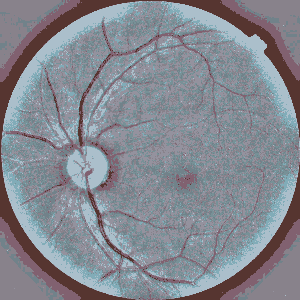

In [ ]:
## Testing Image
import cv2
img = cv2.imread('/content/citra_konversi/0NoDR/002c21358ce6.png', cv2.IMREAD_UNCHANGED)
print ("---8 BIT IMAGE CONVERT NODR---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/1Mild'
base_dir_dst = '/content/citra_konversi/1Mild'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=8)
        converted_img.save(os.path.join(base_dir_dst, filename))

---8 BIT IMAGE CONVERT MILD---


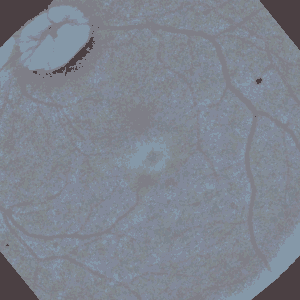

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/1Mild/00140acc2bde.png', cv2.IMREAD_UNCHANGED)
print ("---8 BIT IMAGE CONVERT MILD---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/2Moderate'
base_dir_dst = '/content/citra_konversi/2Moderate'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=8)
        converted_img.save(os.path.join(base_dir_dst, filename))

---8 BIT IMAGE CONVERT Moderate---


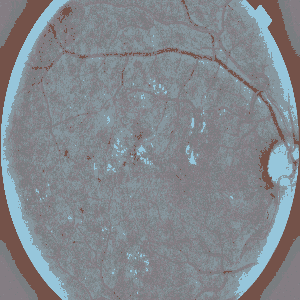

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/2Moderate/000c1434d8d7.png', cv2.IMREAD_UNCHANGED)
print ("---8 BIT IMAGE CONVERT Moderate---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/3Severe'
base_dir_dst = '/content/citra_konversi/3Severe'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=8)
        converted_img.save(os.path.join(base_dir_dst, filename))

---8 BIT IMAGE CONVERT Severe---


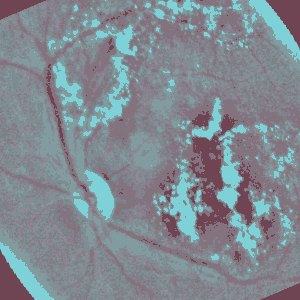

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/3Severe/0008a2e208bf.png', cv2.IMREAD_UNCHANGED)
print ("---8 BIT IMAGE CONVERT Severe---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/4ProliferativeDR'
base_dir_dst = '/content/citra_konversi/4ProliferativeDR'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=8)
        converted_img.save(os.path.join(base_dir_dst, filename))

---8 BIT IMAGE CONVERT PRILIFERATIVE---


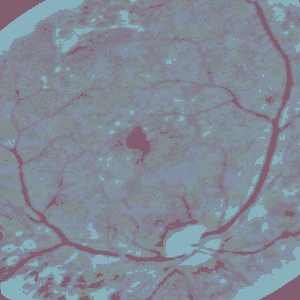

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/4ProliferativeDR/000af3691390.png', cv2.IMREAD_UNCHANGED)
print ("---8 BIT IMAGE CONVERT PRILIFERATIVE---")
cv2_imshow(img)


In [ ]:
#Checking Total File
test0=os.listdir('/content/citra_konversi/0NoDR')
test1=os.listdir('/content/citra_konversi/1Mild')
test2=os.listdir('/content/citra_konversi/2Moderate')
test3=os.listdir('/content/citra_konversi/3Severe')
test4=os.listdir('/content/citra_konversi/4ProliferativeDR')


print("Class 0: ",len(test0))
print("Class 1: ",len(test1))
print("Class 2: ",len(test2))
print("Class 3: ",len(test3))
print("Class 4: ",len(test4))

Class 0:  2000
Class 1:  2000
Class 2:  2000
Class 3:  2000
Class 4:  2000


In [ ]:
import os
import numpy as np
import shutil
import pandas as pd


def train_test_split():
    print("########### Train Test Val Script started ###########")
   
    root_dir = '/content/citra_baru'
    classes_dir = ['0NoDR', '1Mild', '2Moderate', '3Severe', '4ProliferativeDR']

    processed_dir = '/content/citra_konversi'

    test_ratio = 0.10
    val_ratio = 0.20

    for cls in classes_dir:
        # Creating partitions of the data after shuffeling
        print("$$$$$$$ Class Name " + cls + " $$$$$$$")
        src = processed_dir +"/" + cls  # Folder to copy images from

        allFileNames = os.listdir(src)
        np.random.shuffle(allFileNames)
        train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                                  [int(len(allFileNames) * (1 - (test_ratio + val_ratio))),
                                                                   int(len(allFileNames) * (1 - test_ratio)),
                                                                   ])

        train_FileNames = [src + '/' + name for name in train_FileNames.tolist()]
        val_FileNames = [src + '/' + name for name in val_FileNames.tolist()]
        test_FileNames = [src + '/' + name for name in test_FileNames.tolist()]

        print('Total images: '+ str(len(allFileNames)))
        print('Training: '+ str(len(train_FileNames)))
        print('Validation: '+  str(len(val_FileNames)))
        print('Testing: '+ str(len(test_FileNames)))

        # # Creating Train / Val / Test folders (One time use)
        os.makedirs(root_dir + '/train/' + cls)
        os.makedirs(root_dir + '/val/' + cls)
        os.makedirs(root_dir + '/test/' + cls)

        # Copy-pasting images
        for name in train_FileNames:
            shutil.copy(name, root_dir + '/train/' + cls)

        for name in val_FileNames:
            shutil.copy(name, root_dir + '/val/' + cls)

        for name in test_FileNames:
            shutil.copy(name, root_dir + '/test/' + cls)

    print("########### Train Test Val Script Ended ###########")

train_test_split()

########### Train Test Val Script started ###########
$$$$$$$ Class Name 0NoDR $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 1Mild $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 2Moderate $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 3Severe $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 4ProliferativeDR $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
########### Train Test Val Script Ended ###########


## Percobaan 1 (Batch Size =8, learning rate=0.0001, epoh=30)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 8
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 30

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

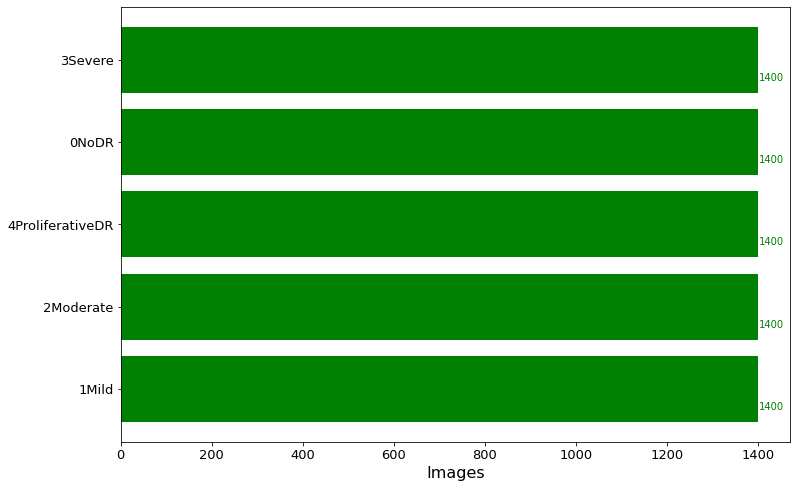

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

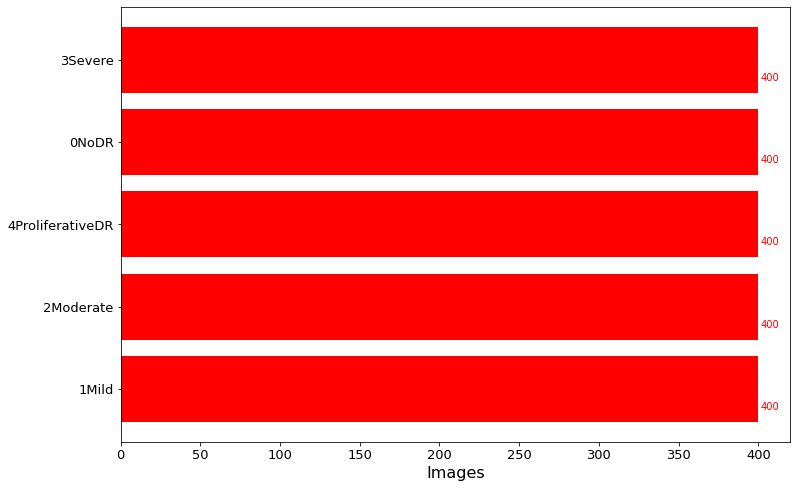

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

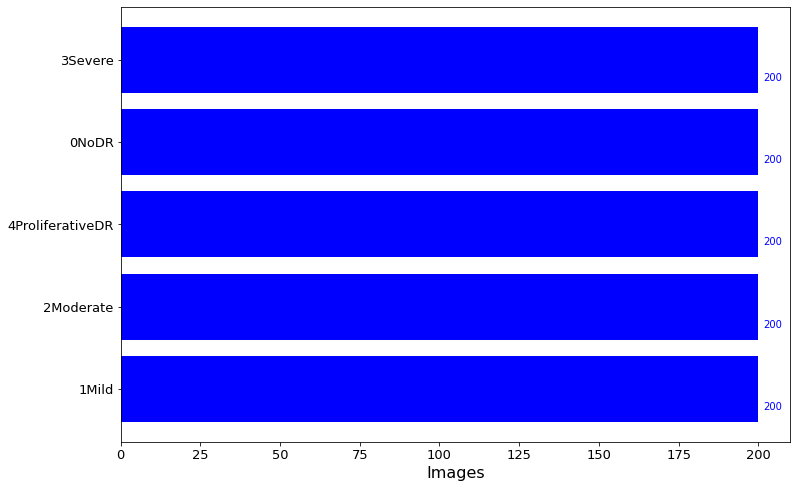

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_names = train_data.class_indices
print(class_names)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


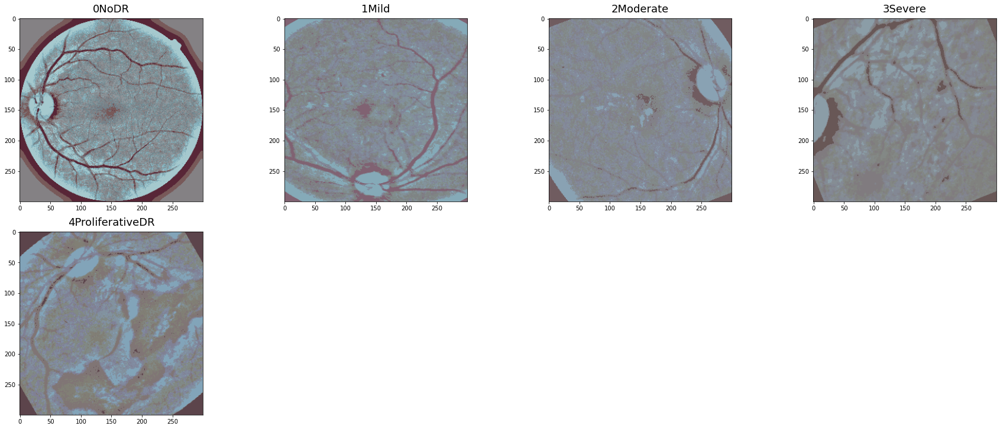

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for dr_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap folder DR
    dr_items = os.listdir(train_folder + '/' + dr_folder) # Masukkan dr items
    dr_selected = np.random.choice(dr_items)
    images.append(os.path.join(train_folder,dr_folder,dr_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 2.8 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.5 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 5 class 
        ], name = "custom_ef_model")


258449408/258434480 [==============================] - 4s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_ef_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)             

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.0001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy']  
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 30 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/30
875/875 [==============================] - 391s 382ms/step - loss: 1.2030 - accuracy: 0.4881 - val_loss: 0.6107 - val_accuracy: 0.7750
Epoch 2/30
875/875 [==============================] - 329s 376ms/step - loss: 0.9823 - accuracy: 0.5991 - val_loss: 0.5585 - val_accuracy: 0.7960
Epoch 3/30
875/875 [==============================] - 328s 375ms/step - loss: 0.9213 - accuracy: 0.6226 - val_loss: 0.4935 - val_accuracy: 0.8070
Epoch 4/30
875/875 [==============================] - 328s 374ms/step - loss: 0.8577 - accuracy: 0.6587 - val_loss: 0.4417 - val_accuracy: 0.8410
Epoch 5/30
875/875 [==============================] - 328s 374ms/step - loss: 0.8026 - accuracy: 0.6757 - val_loss: 0.4035 - val_accuracy: 0.8650
Epoch 6/30
875/875 [==============================] - 328s 375ms/step - loss: 0.7463 - accuracy: 0.7144 - val_loss: 0.3862 - val_accuracy: 0.8630
Epoch 7/30
875/875 [==============================] - 327s 374ms/step - loss: 0.7173 - accuracy: 0.7190 - val_loss: 0.4241 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

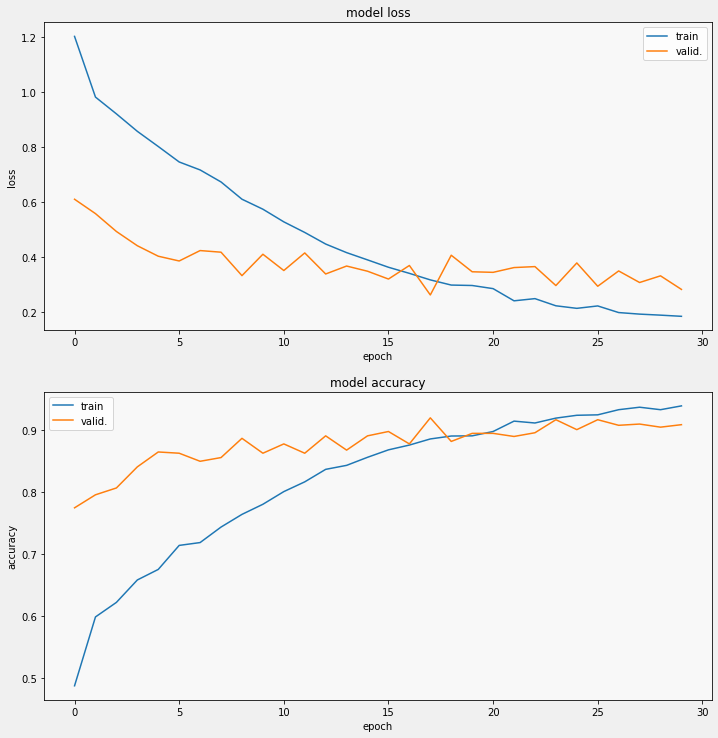

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
!mkdir save_model

In [ ]:
# Menyimpan Model yang telah di train dengan format .h5
model_ef_custom.save('/content/saved_model/Model8bit.h5')

In [ ]:
# Memanggil model yang telah tersimpan
import tensorflow as tf
from tensorflow.keras.models import load_model
loaded_model = tf.keras.models.load_model('/content/Model1_DR_8BIT.h5')

In [ ]:
# Melakukan evaluasi model yang telah di train terhadap data pengujian

test_accuracy = model_ef_custom.evaluate(test_data)
print(" test akurasi  : ", test_accuracy[1]*100, "%")

125/125 [==============================] - 14s 109ms/step - loss: 0.3217 - accuracy: 0.9040
 test akurasi  :  90.39999842643738 %


Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.94      0.99      0.97       200
           1Mild       0.87      0.86      0.87       200
       2Moderate       0.88      0.83      0.86       200
         3Severe       0.88      0.96      0.92       200
4ProliferativeDR       0.91      0.84      0.88       200

        accuracy                           0.90      1000
       macro avg       0.90      0.90      0.90      1000
    weighted avg       0.90      0.90      0.90      1000



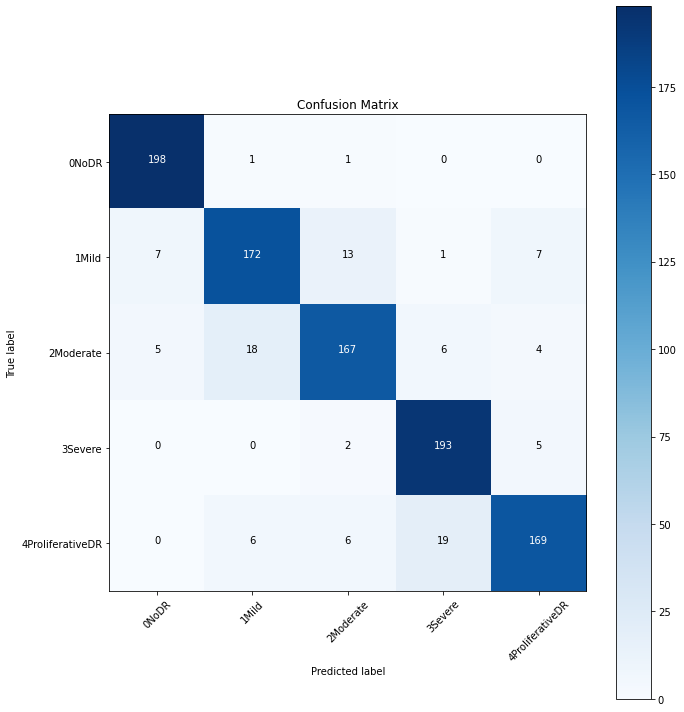

In [ ]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_ef_custom.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

## Percobaan 2 (Batch Size =16, learning rate=0.00001, epoch=60)

In [ ]:
train_dir =  '/content/citra_baruu/train'   #Direktori Train
validation_dir = '/content/citra_baruu/val'  #Direktori Vaildation
test_dir =  '/content/citra_baruu/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 16
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 60

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

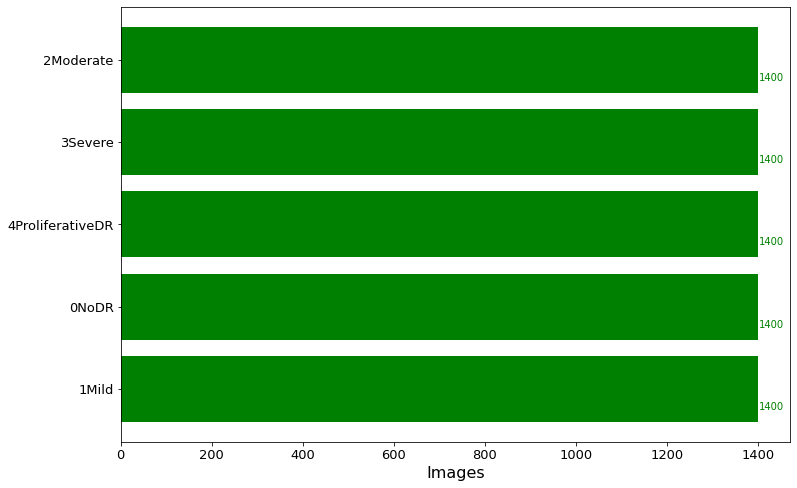

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

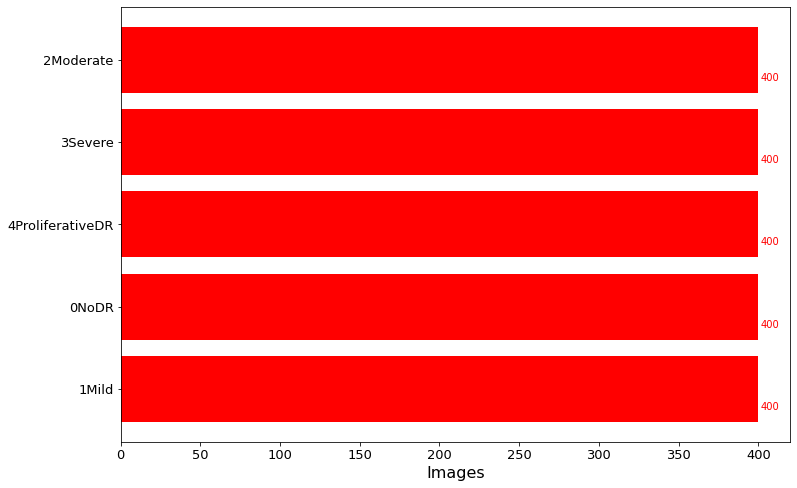

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

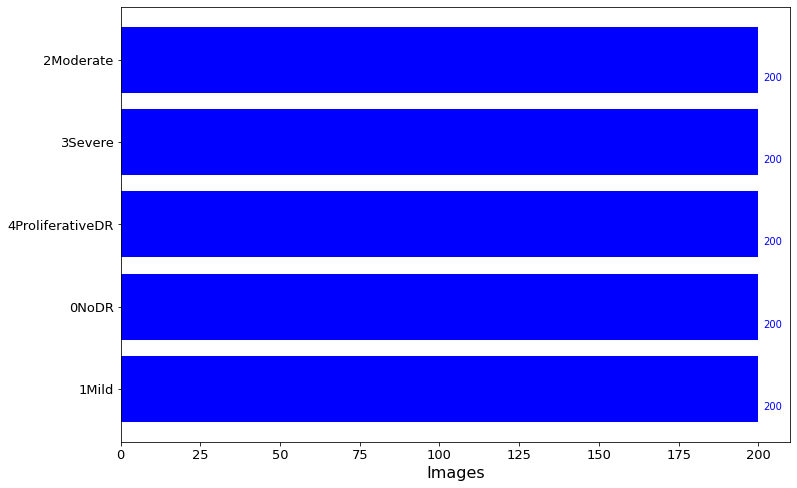

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

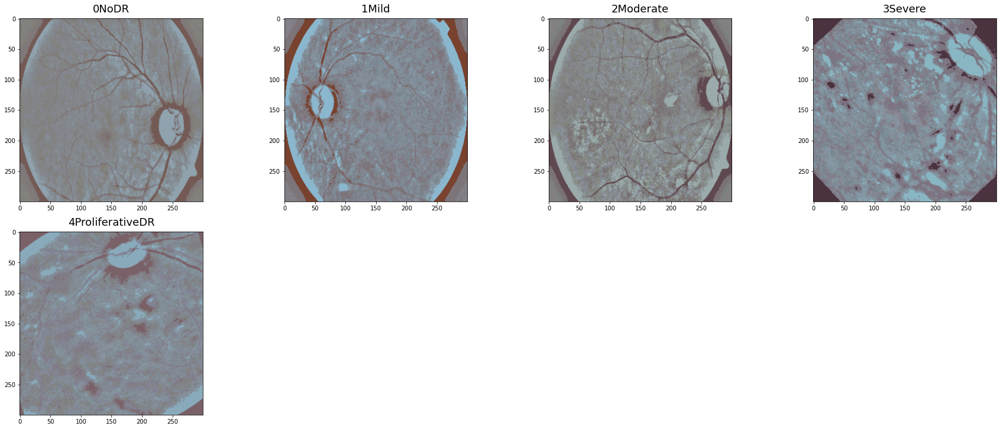

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for DR_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap DR folder yang didefinisikan sebagai train folder
    DR_items = os.listdir(train_folder + '/' + DR_folder) # Masukkan DR items
    DR_selected = np.random.choice(DR_items)
    images.append(os.path.join(train_folder,DR_folder,DR_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_name = train_data.class_indices
print(class_name)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 2.9 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_eff = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_eff_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_eff,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.2 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 15 class 
        ], name = "custom_ef_model")


258449408/258434480 [==============================] - 7s 0us/step


In [ ]:
model_eff_custom.summary()

Model: "custom_ef_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)             

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.00001)
model_eff_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy']  
                              )

In [ ]:
import time
start = time.time()
history = model_eff_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 60 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/60
437/437 [==============================] - 345s 659ms/step - loss: 1.5309 - accuracy: 0.3214 - val_loss: 1.1080 - val_accuracy: 0.5714
Epoch 2/60
437/437 [==============================] - 282s 644ms/step - loss: 1.3255 - accuracy: 0.4253 - val_loss: 0.9912 - val_accuracy: 0.5933
Epoch 3/60
437/437 [==============================] - 282s 645ms/step - loss: 1.2197 - accuracy: 0.4799 - val_loss: 0.9015 - val_accuracy: 0.6508
Epoch 4/60
437/437 [==============================] - 282s 644ms/step - loss: 1.1735 - accuracy: 0.5097 - val_loss: 0.8421 - val_accuracy: 0.6905
Epoch 5/60
437/437 [==============================] - 282s 644ms/step - loss: 1.0881 - accuracy: 0.5389 - val_loss: 0.7139 - val_accuracy: 0.7530
Epoch 6/60
437/437 [==============================] - 282s 644ms/step - loss: 1.0574 - accuracy: 0.5611 - val_loss: 0.6685 - val_accuracy: 0.7520
Epoch 7/60
437/437 [==============================] - 282s 644ms/step - loss: 1.0092 - accuracy: 0.5781 - val_loss: 0.6315 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

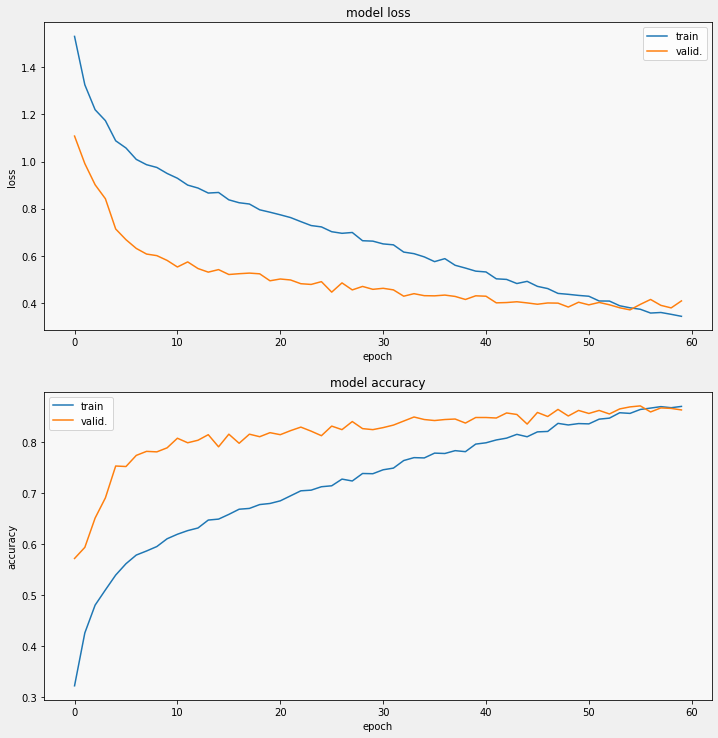

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
model_eff_custom.save('Model28bit.h5')

Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.90      0.99      0.95       200
           1Mild       0.85      0.81      0.83       200
       2Moderate       0.79      0.77      0.78       200
         3Severe       0.82      0.84      0.83       200
4ProliferativeDR       0.85      0.81      0.83       200

        accuracy                           0.84      1000
       macro avg       0.84      0.84      0.84      1000
    weighted avg       0.84      0.84      0.84      1000



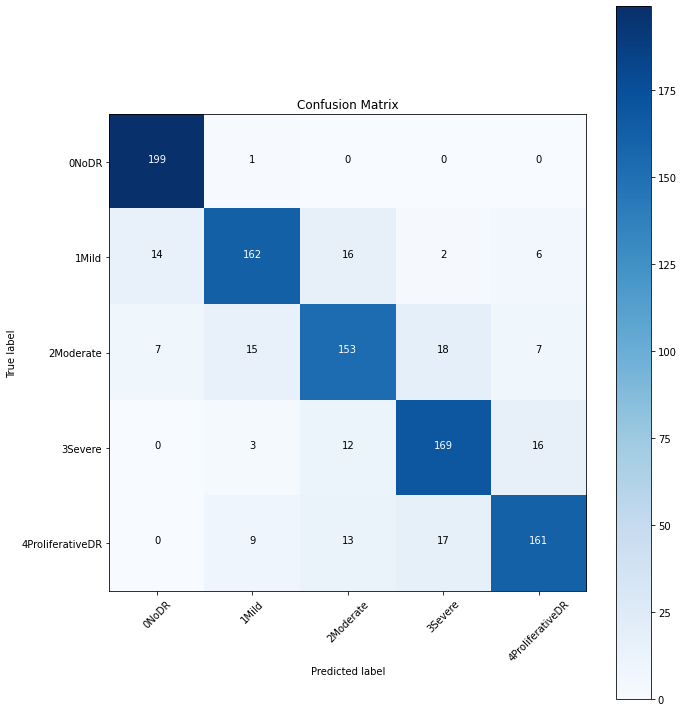

In [ ]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_eff_custom.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

## Percobaan 3 (Batch Size =18, learning rate=0.000001, epoch=90)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 18
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 90

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

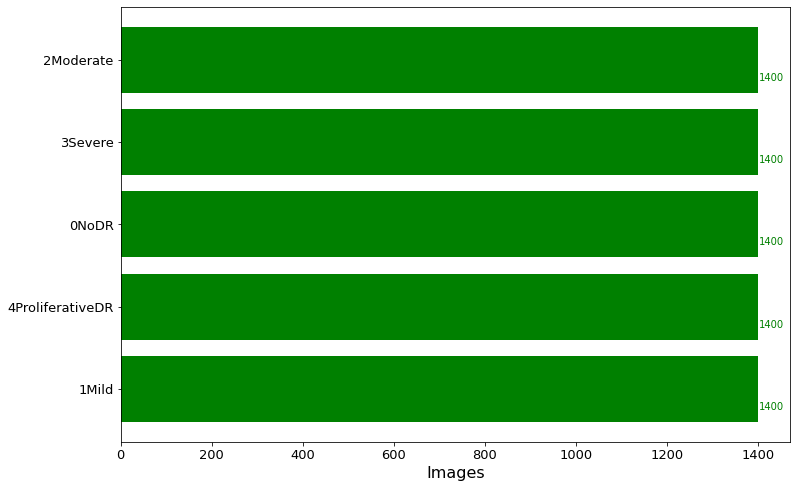

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

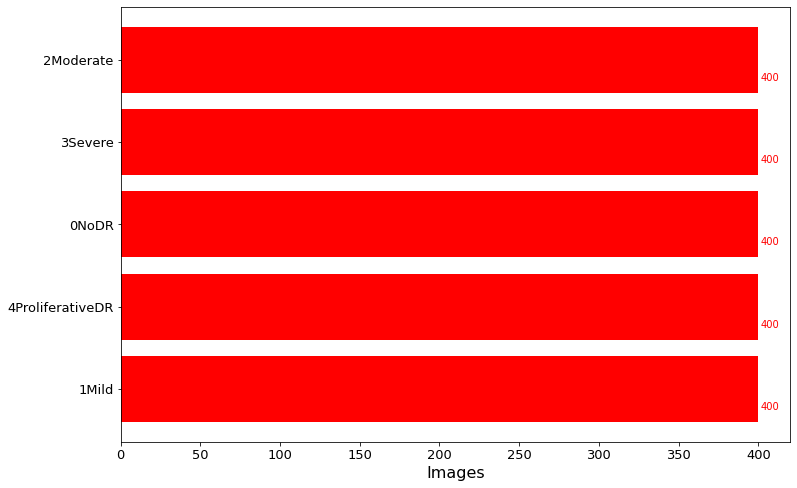

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

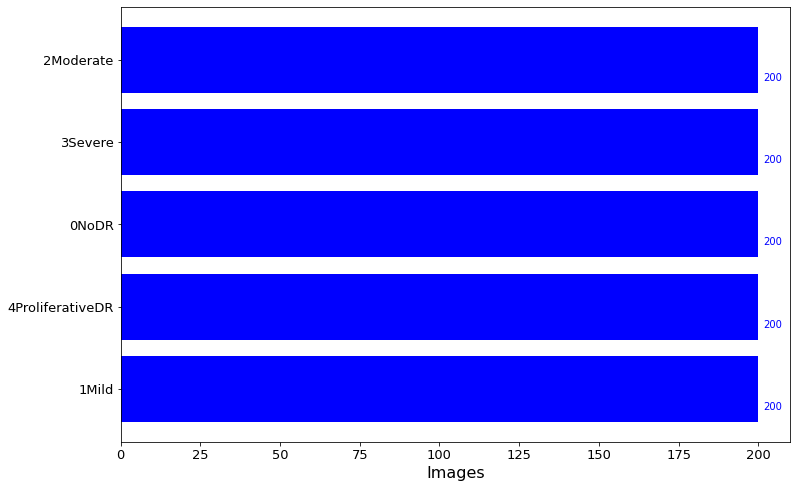

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

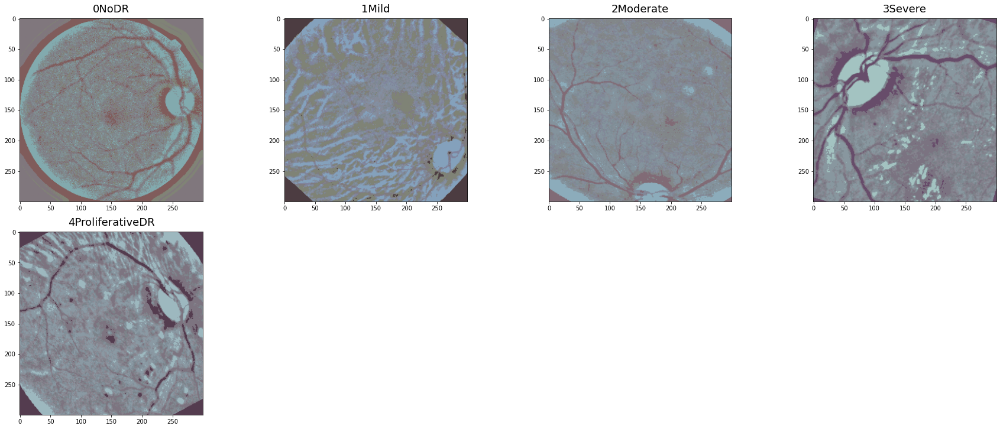

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for food_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap food folder yang didefinisikan sebagai train folder
    food_items = os.listdir(train_folder + '/' + food_folder) # Masukkan food items
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder,food_folder,food_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_name = train_data.class_indices
print(class_name)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 5.7 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.2 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 15 class 
        ], name = "custom_eff_model")


258449408/258434480 [==============================] - 43s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_eff_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)            

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.000001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy'],
                               
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data untuk validation step yaitu test dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 90 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/90
388/388 [==============================] - 450s 1s/step - loss: 1.7099 - accuracy: 0.2247 - val_loss: 1.4631 - val_accuracy: 0.4147
Epoch 2/90
388/388 [==============================] - 402s 1s/step - loss: 1.6648 - accuracy: 0.2520 - val_loss: 1.4040 - val_accuracy: 0.4395
Epoch 3/90
388/388 [==============================] - 401s 1s/step - loss: 1.6146 - accuracy: 0.2806 - val_loss: 1.3675 - val_accuracy: 0.4573
Epoch 4/90
388/388 [==============================] - 401s 1s/step - loss: 1.5754 - accuracy: 0.3023 - val_loss: 1.3173 - val_accuracy: 0.4683
Epoch 5/90
388/388 [==============================] - 402s 1s/step - loss: 1.5501 - accuracy: 0.3216 - val_loss: 1.2713 - val_accuracy: 0.4831
Epoch 6/90
388/388 [==============================] - 401s 1s/step - loss: 1.5073 - accuracy: 0.3397 - val_loss: 1.2269 - val_accuracy: 0.4921
Epoch 7/90
388/388 [==============================] - 401s 1s/step - loss: 1.4843 - accuracy: 0.3534 - val_loss: 1.2091 - val_accuracy: 0.4980

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

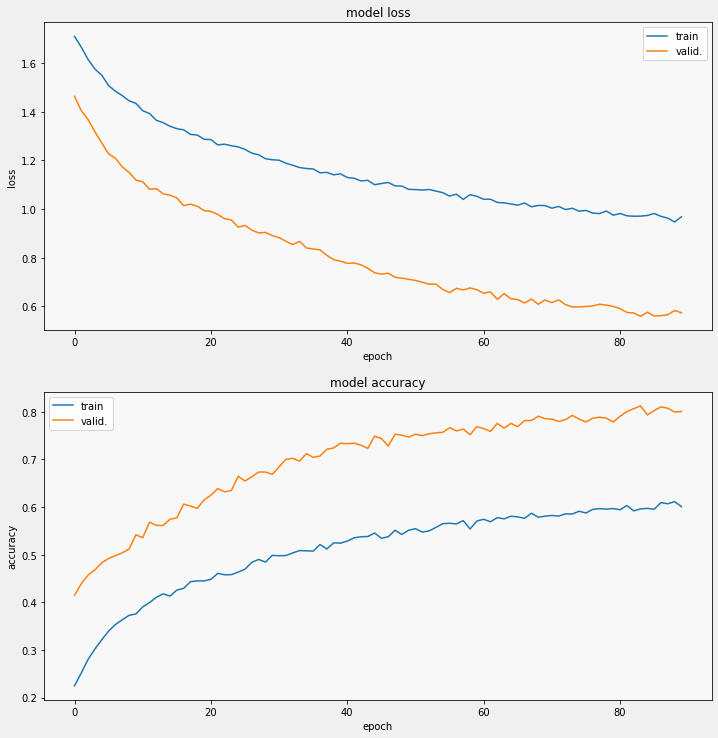

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
model_ef_custom.save('Model38bit_efficiennet.h5')

Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.92      0.97      0.95       200
           1Mild       0.62      0.66      0.64       200
       2Moderate       0.49      0.65      0.56       200
         3Severe       0.59      0.58      0.59       200
4ProliferativeDR       0.59      0.34      0.44       200

        accuracy                           0.64      1000
       macro avg       0.64      0.64      0.63      1000
    weighted avg       0.64      0.64      0.63      1000



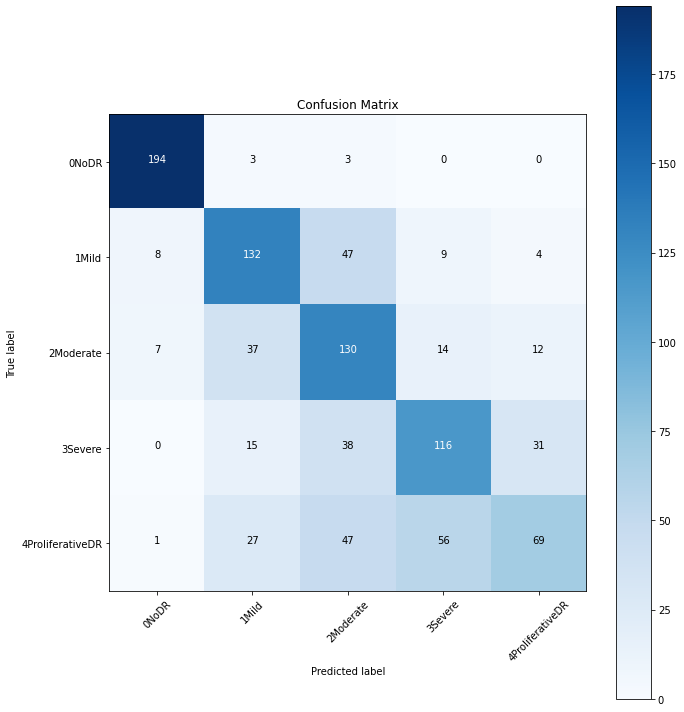

In [ ]:

def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_ef_custom.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

# DIABETIC RETINOPATHY 16 BIT IMAGE

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True) 

Mounted at /content/drive


In [ ]:
#Load dataset dari Kaggle
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
from google.colab import files
files.upload()
!cp kaggle.json ~/.kaggle/
!kaggle datasets download -d aitude/aptos-augmented-images
!ls

Saving kaggle.json to kaggle.json
 99% 2.74G/2.77G [00:11<00:00, 253MB/s]
100% 2.77G/2.77G [00:11<00:00, 258MB/s]
aptos-augmented-images.zip  drive  kaggle.json	sample_data


In [ ]:
!unzip /content/aptos-augmented-images.zip

Output streaming akan dipotong hingga 5000 baris terakhir.
  inflating: aptos-augmented-images/aptos-augmented-images/2/7dd834c00140.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7de7beaf5e9f.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7dee6bf8b9c1.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7df4bb0f86f7.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e0dc2e2fa5e.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e6e90a93aa5.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7e9458de5707.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7ea51381ff6a.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7ec1ffe8220b.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f17e6883f9f.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/7f1f77407d32.png  
  inflating: aptos-augmented-images/aptos-augmented-images/2/

In [ ]:
import os

In [ ]:
!mkdir citra

In [ ]:
!mkdir /content/citra/0NoDR
!mkdir /content/citra/1Mild
!mkdir /content/citra/2Moderate
!mkdir /content/citra/3Severe
!mkdir /content/citra/4ProliferativeDR

In [ ]:
# #train move
import shutil
import os

source_dir = '/content/aptos-augmented-images/aptos-augmented-images/0'
target_dir = '/content/citra/0NoDR'
source_dir1 = '/content/aptos-augmented-images/aptos-augmented-images/1'
target_dir1 = '/content/citra/1Mild'
source_dir2 = '/content/aptos-augmented-images/aptos-augmented-images/2'
target_dir2 = '/content/citra/2Moderate'
source_dir3 = '/content/aptos-augmented-images/aptos-augmented-images/3'
target_dir3 = '/content/citra/3Severe'
source_dir4 = '/content/aptos-augmented-images/aptos-augmented-images/4'
target_dir4 = '/content/citra/4ProliferativeDR'
    
file_names = os.listdir(source_dir)
file_names1 = os.listdir(source_dir1)
file_names2 = os.listdir(source_dir2)
file_names3 = os.listdir(source_dir3)
file_names4 = os.listdir(source_dir4)
    
for file_name in file_names:
    shutil.move(os.path.join(source_dir, file_name), target_dir)

for file_names1 in file_names1:
    shutil.move(os.path.join(source_dir1, file_names1), target_dir1)

for file_names2 in file_names2:
    shutil.move(os.path.join(source_dir2, file_names2), target_dir2)

for file_names3 in file_names3:
    shutil.move(os.path.join(source_dir3, file_names3), target_dir3)

for file_names4 in file_names4:
    shutil.move(os.path.join(source_dir4, file_names4), target_dir4)

In [ ]:
!mkdir citra_konversi

In [ ]:
!mkdir /content/citra_konversi/0NoDR
!mkdir /content/citra_konversi/1Mild
!mkdir /content/citra_konversi/2Moderate
!mkdir /content/citra_konversi/3Severe
!mkdir /content/citra_konversi/4ProliferativeDR

In [ ]:
from google.colab.patches import cv2_imshow
from PIL import Image
import os

In [ ]:
#Konversi NoDR
base_dir_src = '/content/citra/0NoDR'
base_dir_dst = '/content/citra_konversi/0NoDR'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=16)
        converted_img.save(os.path.join(base_dir_dst, filename))

---16 BIT IMAGE CONVERT NODR---


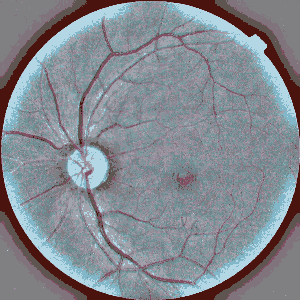

In [ ]:
## Testing Image
import cv2
img = cv2.imread('/content/citra_konversi/0NoDR/002c21358ce6.png', cv2.IMREAD_UNCHANGED)
print ("---16 BIT IMAGE CONVERT NODR---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/1Mild'
base_dir_dst = '/content/citra_konversi/1Mild'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=16)
        converted_img.save(os.path.join(base_dir_dst, filename))

---16 BIT IMAGE CONVERT MILD---


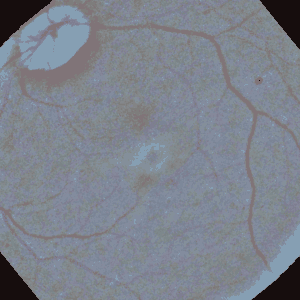

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/1Mild/00140acc2bde.png', cv2.IMREAD_UNCHANGED)
print ("---16 BIT IMAGE CONVERT MILD---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/2Moderate'
base_dir_dst = '/content/citra_konversi/2Moderate'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=16)
        converted_img.save(os.path.join(base_dir_dst, filename))

---16 BIT IMAGE CONVERT Moderate---


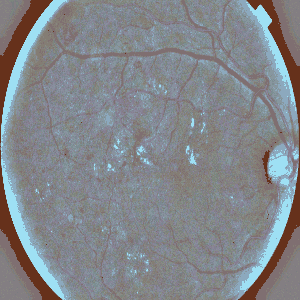

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/2Moderate/000c1434d8d7.png', cv2.IMREAD_UNCHANGED)
print ("---16 BIT IMAGE CONVERT Moderate---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/3Severe'
base_dir_dst = '/content/citra_konversi/3Severe'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=16)
        converted_img.save(os.path.join(base_dir_dst, filename))

---16 BIT IMAGE CONVERT Severe---


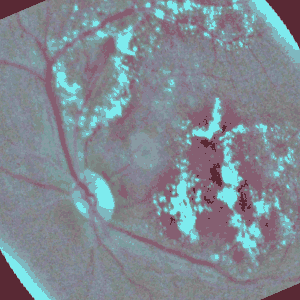

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/3Severe/0008a2e208bf.png', cv2.IMREAD_UNCHANGED)
print ("---16 BIT IMAGE CONVERT Severe---")
cv2_imshow(img)


In [ ]:
base_dir_src = '/content/citra/4ProliferativeDR'
base_dir_dst = '/content/citra_konversi/4ProliferativeDR'
os.chdir(base_dir_src)

for filename in os.listdir():
    with Image.open(filename) as img:
        converted_img = img.convert(mode='P', palette=Image.ADAPTIVE, colors=16)
        converted_img.save(os.path.join(base_dir_dst, filename))

---16 BIT IMAGE CONVERT PRILIFERATIVE---


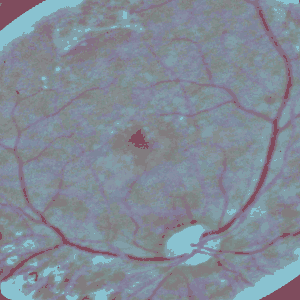

In [ ]:
## Testing Image
img = cv2.imread('/content/citra_konversi/4ProliferativeDR/000af3691390.png', cv2.IMREAD_UNCHANGED)
print ("---16 BIT IMAGE CONVERT PRILIFERATIVE---")
cv2_imshow(img)


In [ ]:
#Checking Total File
test0=os.listdir('/content/citra_konversi/0NoDR')
test1=os.listdir('/content/citra_konversi/1Mild')
test2=os.listdir('/content/citra_konversi/2Moderate')
test3=os.listdir('/content/citra_konversi/3Severe')
test4=os.listdir('/content/citra_konversi/4ProliferativeDR')


print("Class 0: ",len(test0))
print("Class 1: ",len(test1))
print("Class 2: ",len(test2))
print("Class 3: ",len(test3))
print("Class 4: ",len(test4))

Class 0:  2000
Class 1:  2000
Class 2:  2000
Class 3:  2000
Class 4:  2000


In [ ]:
import os
import numpy as np
import shutil
import pandas as pd


def train_test_split():
    print("########### Train Test Val Script started ###########")
   
    root_dir = '/content/citra_baru'
    classes_dir = ['0NoDR', '1Mild', '2Moderate', '3Severe', '4ProliferativeDR']

    processed_dir = '/content/citra_konversi'

    test_ratio = 0.10
    val_ratio = 0.20

    for cls in classes_dir:
        # Creating partitions of the data after shuffeling
        print("$$$$$$$ Class Name " + cls + " $$$$$$$")
        src = processed_dir +"/" + cls  # Folder to copy images from

        allFileNames = os.listdir(src)
        np.random.shuffle(allFileNames)
        train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                                  [int(len(allFileNames) * (1 - (test_ratio + val_ratio))),
                                                                   int(len(allFileNames) * (1 - test_ratio)),
                                                                   ])

        train_FileNames = [src + '/' + name for name in train_FileNames.tolist()]
        val_FileNames = [src + '/' + name for name in val_FileNames.tolist()]
        test_FileNames = [src + '/' + name for name in test_FileNames.tolist()]

        print('Total images: '+ str(len(allFileNames)))
        print('Training: '+ str(len(train_FileNames)))
        print('Validation: '+  str(len(val_FileNames)))
        print('Testing: '+ str(len(test_FileNames)))

        # # Creating Train / Val / Test folders (One time use)
        os.makedirs(root_dir + '/train/' + cls)
        os.makedirs(root_dir + '/val/' + cls)
        os.makedirs(root_dir + '/test/' + cls)

        # Copy-pasting images
        for name in train_FileNames:
            shutil.copy(name, root_dir + '/train/' + cls)

        for name in val_FileNames:
            shutil.copy(name, root_dir + '/val/' + cls)

        for name in test_FileNames:
            shutil.copy(name, root_dir + '/test/' + cls)

    print("########### Train Test Val Script Ended ###########")

train_test_split()

########### Train Test Val Script started ###########
$$$$$$$ Class Name 0NoDR $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 1Mild $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 2Moderate $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 3Severe $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
$$$$$$$ Class Name 4ProliferativeDR $$$$$$$
Total images: 2000
Training: 1400
Validation: 400
Testing: 200
########### Train Test Val Script Ended ###########


## Percobaan 1 (Batch Size =8, learning rate=0.0001, epoh=30)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 8
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 30

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

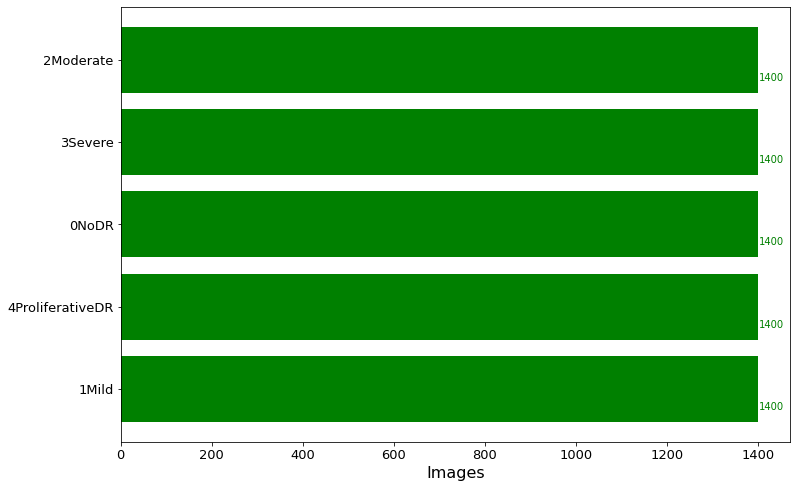

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

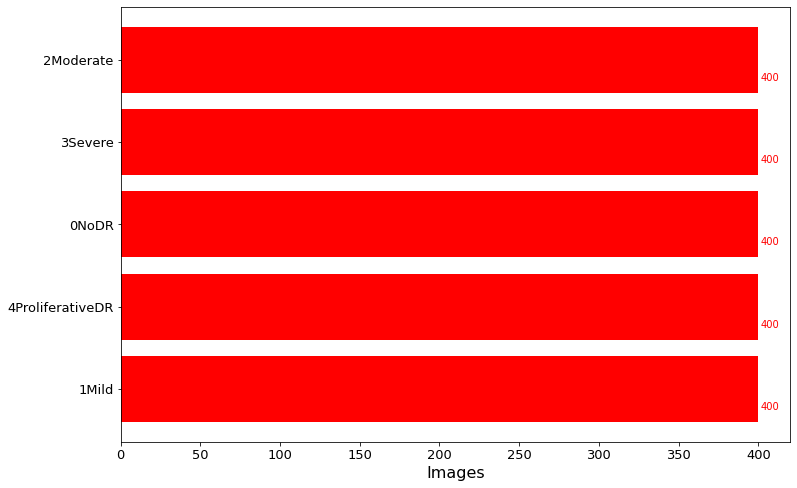

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

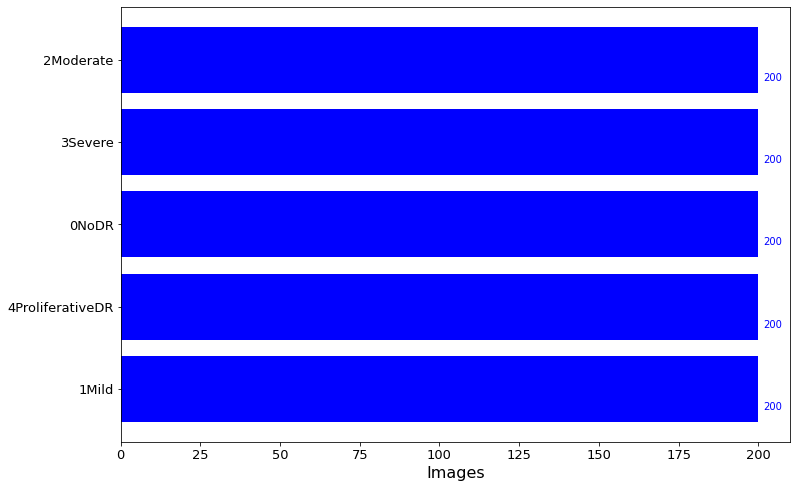

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_names = train_data.class_indices
print(class_names)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


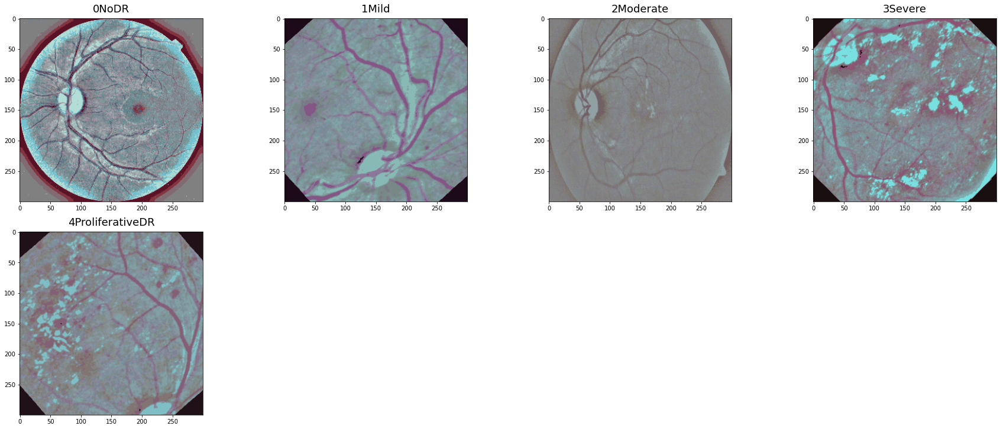

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for dr_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap folder DR
    dr_items = os.listdir(train_folder + '/' + dr_folder) # Masukkan dr items
    dr_selected = np.random.choice(dr_items)
    images.append(os.path.join(train_folder,dr_folder,dr_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 4.7 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.5 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 5 class 
        ], name = "custom_ef_model")


258449408/258434480 [==============================] - 7s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_ef_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)             

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.0001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy']  
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 30 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/30
875/875 [==============================] - 496s 516ms/step - loss: 1.1816 - accuracy: 0.4980 - val_loss: 0.6598 - val_accuracy: 0.7670
Epoch 2/30
875/875 [==============================] - 450s 514ms/step - loss: 0.9693 - accuracy: 0.6029 - val_loss: 0.5699 - val_accuracy: 0.7860
Epoch 3/30
875/875 [==============================] - 450s 514ms/step - loss: 0.8863 - accuracy: 0.6430 - val_loss: 0.4794 - val_accuracy: 0.8260
Epoch 4/30
875/875 [==============================] - 450s 514ms/step - loss: 0.8118 - accuracy: 0.6781 - val_loss: 0.4127 - val_accuracy: 0.8540
Epoch 5/30
875/875 [==============================] - 450s 514ms/step - loss: 0.7633 - accuracy: 0.7020 - val_loss: 0.4141 - val_accuracy: 0.8530
Epoch 6/30
875/875 [==============================] - 450s 514ms/step - loss: 0.7057 - accuracy: 0.7281 - val_loss: 0.4944 - val_accuracy: 0.8150
Epoch 7/30
875/875 [==============================] - 450s 514ms/step - loss: 0.6493 - accuracy: 0.7420 - val_loss: 0.3825 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

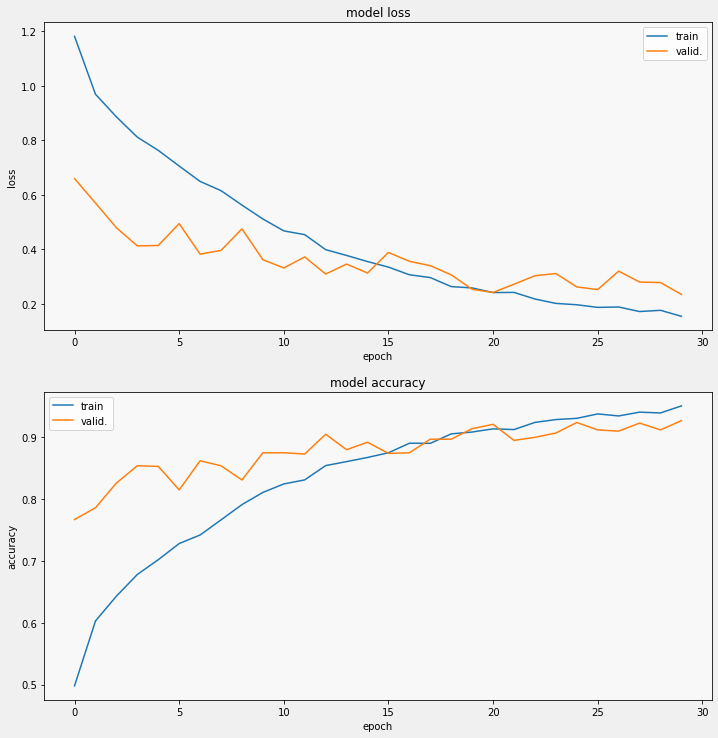

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
!mkdir save_model

In [ ]:
# Menyimpan Model yang telah di train dengan format .h5
model_ef_custom.save('/content/saved_model/Model6bit.h5')

In [ ]:
# Memanggil model yang telah tersimpan
import tensorflow as tf
from tensorflow.keras.models import load_model
loaded_model = tf.keras.models.load_model('/content/saved_model/Model6bit.h5')

Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.97      0.99      0.98       200
           1Mild       0.91      0.93      0.92       200
       2Moderate       0.87      0.83      0.85       200
         3Severe       0.91      0.94      0.92       200
4ProliferativeDR       0.90      0.88      0.89       200

        accuracy                           0.91      1000
       macro avg       0.91      0.91      0.91      1000
    weighted avg       0.91      0.91      0.91      1000



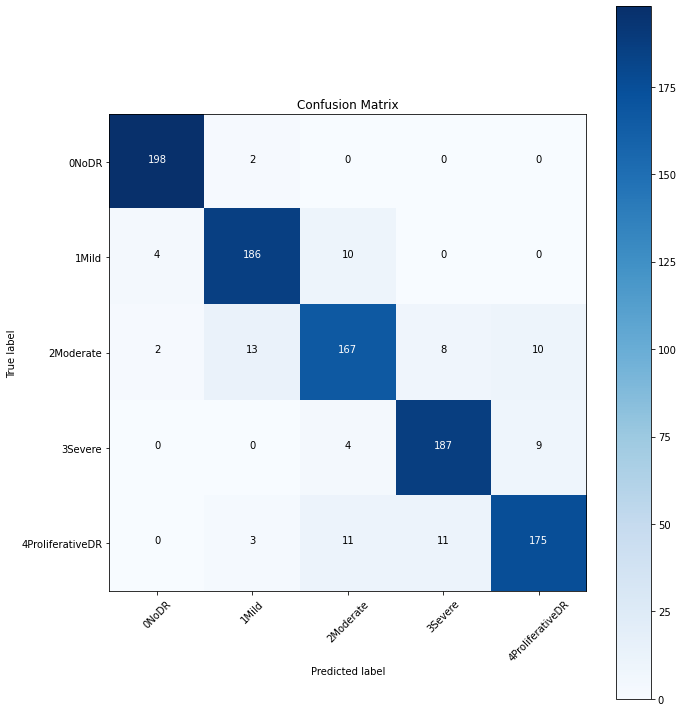

In [ ]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_ef_custom.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

## Percobaan 2 (Batch Size =16, learning rate=0.00001, epoch=60)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 16
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 60

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

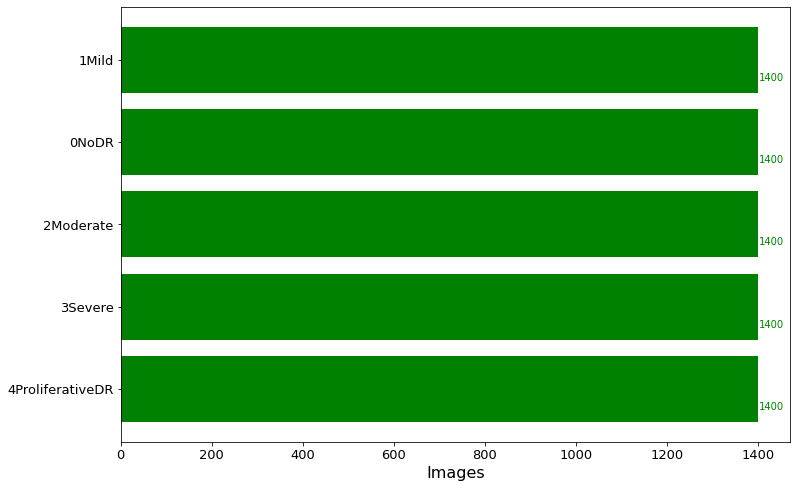

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

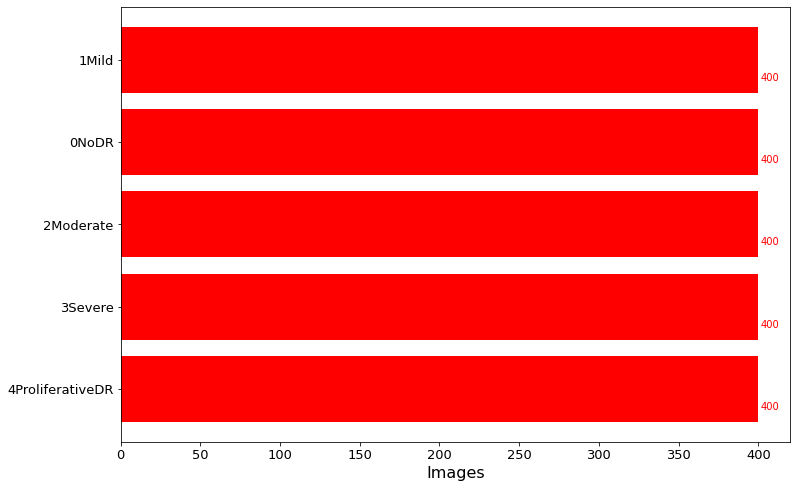

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

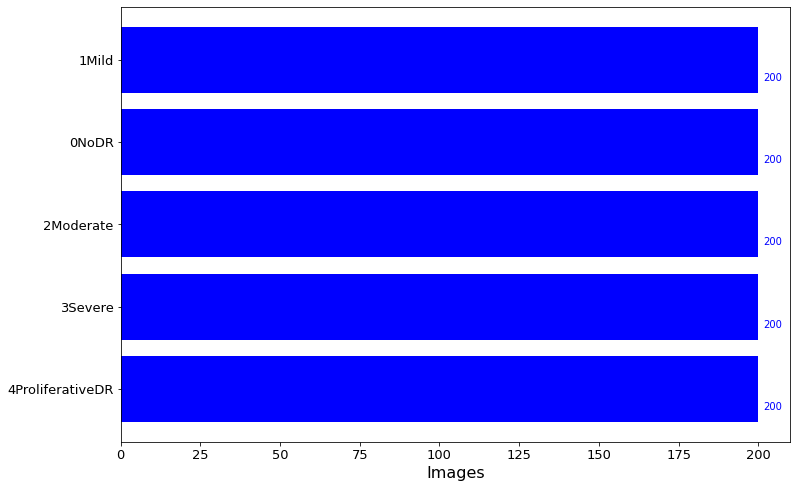

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

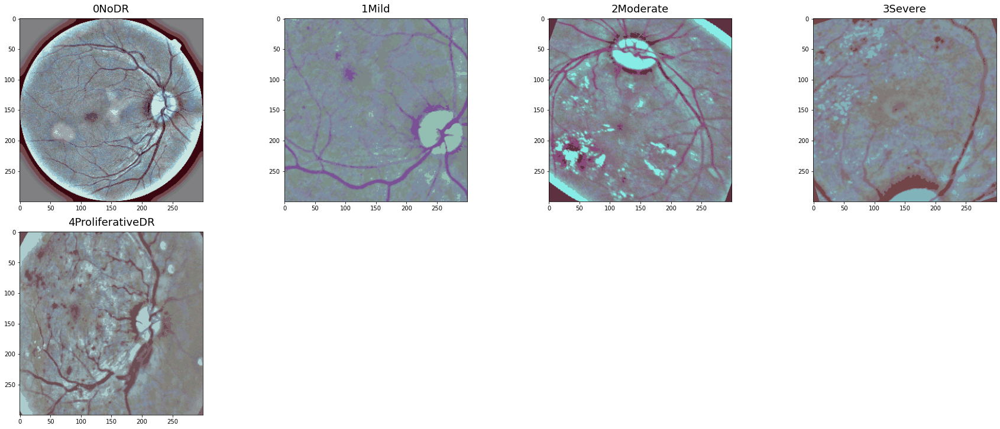

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for DR_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap DR folder yang didefinisikan sebagai train folder
    DR_items = os.listdir(train_folder + '/' + DR_folder) # Masukkan DR items
    DR_selected = np.random.choice(DR_items)
    images.append(os.path.join(train_folder,DR_folder,DR_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_name = train_data.class_indices
print(class_name)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 6.2 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_eff = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_eff_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_eff,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.2 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 15 class 
        ], name = "custom_ef_model")


258449408/258434480 [==============================] - 45s 0us/step


In [ ]:
model_eff_custom.summary()

Model: "custom_ef_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)             

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.00001)
model_eff_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy']  
                              )

In [ ]:
import time
start = time.time()
history = model_eff_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 30 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/60
437/437 [==============================] - 440s 913ms/step - loss: 1.5280 - accuracy: 0.3263 - val_loss: 1.0640 - val_accuracy: 0.6111
Epoch 2/60
437/437 [==============================] - 399s 913ms/step - loss: 1.3072 - accuracy: 0.4409 - val_loss: 0.9539 - val_accuracy: 0.6409
Epoch 3/60
437/437 [==============================] - 400s 915ms/step - loss: 1.1977 - accuracy: 0.4846 - val_loss: 0.8500 - val_accuracy: 0.7044
Epoch 4/60
437/437 [==============================] - 400s 914ms/step - loss: 1.1270 - accuracy: 0.5173 - val_loss: 0.7621 - val_accuracy: 0.7292
Epoch 5/60
437/437 [==============================] - 399s 913ms/step - loss: 1.0619 - accuracy: 0.5547 - val_loss: 0.6748 - val_accuracy: 0.7718
Epoch 6/60
437/437 [==============================] - 399s 912ms/step - loss: 1.0300 - accuracy: 0.5673 - val_loss: 0.6539 - val_accuracy: 0.7718
Epoch 7/60
437/437 [==============================] - 399s 912ms/step - loss: 0.9980 - accuracy: 0.5789 - val_loss: 0.6154 -

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

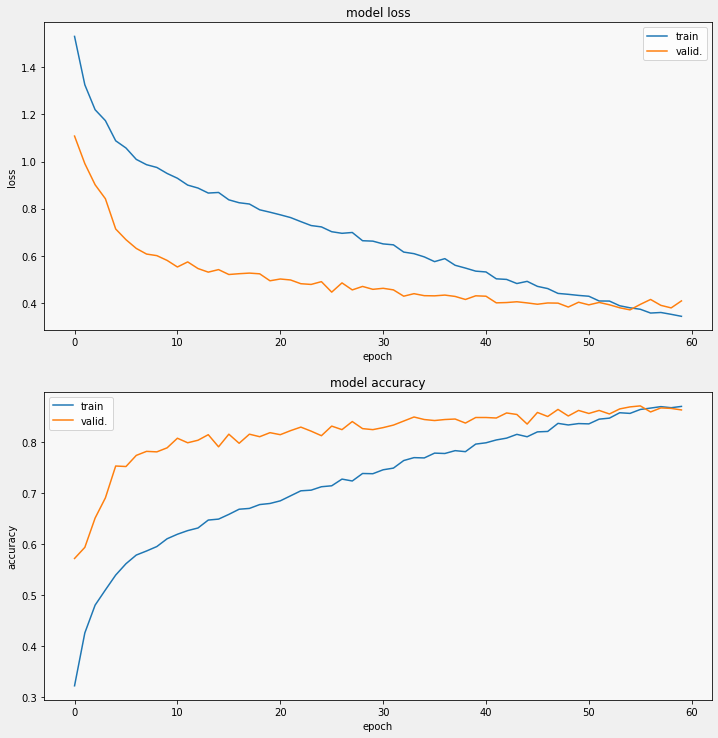

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
model_eff_custom.save('Model28bit.h5')

In [ ]:
# Melakukan evaluasi model yang telah di train terhadap data pengujian

test_accuracy = model_eff_custom.evaluate(test_data)
print(" test akurasi 1000 data  : ", test_accuracy[1]*100, "%")

63/63 [==============================] - 13s 201ms/step - loss: 0.5067 - accuracy: 0.8320
 test akurasi 1000 data  :  83.20000171661377 %


Confusion Matrix
Confusion matrix, without normalization
Classification Report
                  precision    recall  f1-score   support

           0NoDR       0.90      0.99      0.95       200
           1Mild       0.85      0.81      0.83       200
       2Moderate       0.79      0.77      0.78       200
         3Severe       0.82      0.84      0.83       200
4ProliferativeDR       0.85      0.81      0.83       200

        accuracy                           0.84      1000
       macro avg       0.84      0.84      0.84      1000
    weighted avg       0.84      0.84      0.84      1000



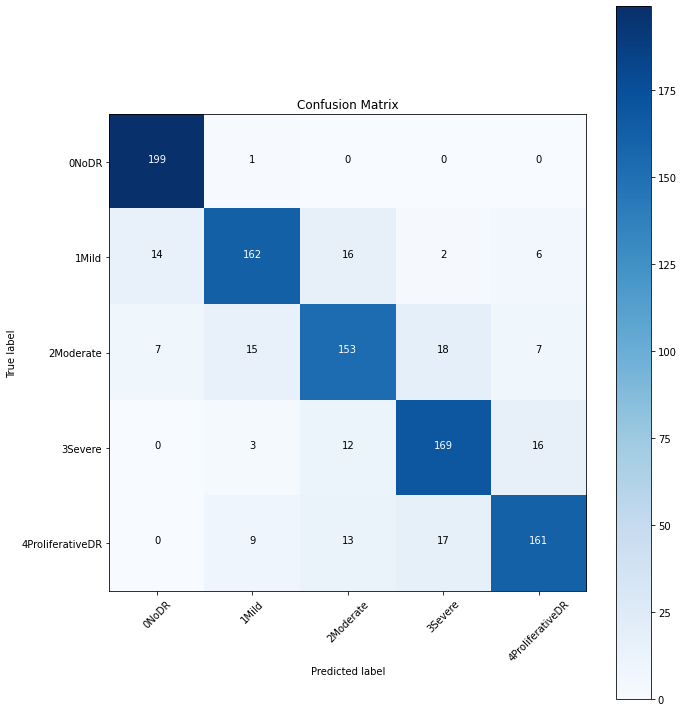

In [ ]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_eff_custom.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))

## Percobaan 3 (Batch Size =18, learning rate=0.000001, epoch=90)

In [ ]:
train_dir =  '/content/citra_baru/train'   #Direktori Train
validation_dir = '/content/citra_baru/val'  #Direktori Vaildation
test_dir =  '/content/citra_baru/test'     #Direktori untuk testing

In [ ]:
BATCH_SIZE = 18
IMG_HEIGHT = 224
IMG_WIDTH = 224
EPOCHS = 90

In [ ]:
# Import Semua Library yang diperlukan 

import matplotlib.pyplot as plt
import os
import numpy as np 
import pandas as pd 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

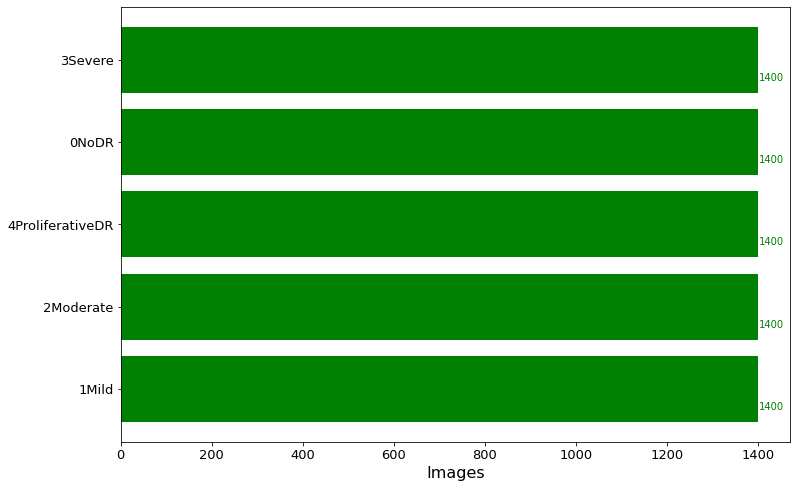

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= train_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

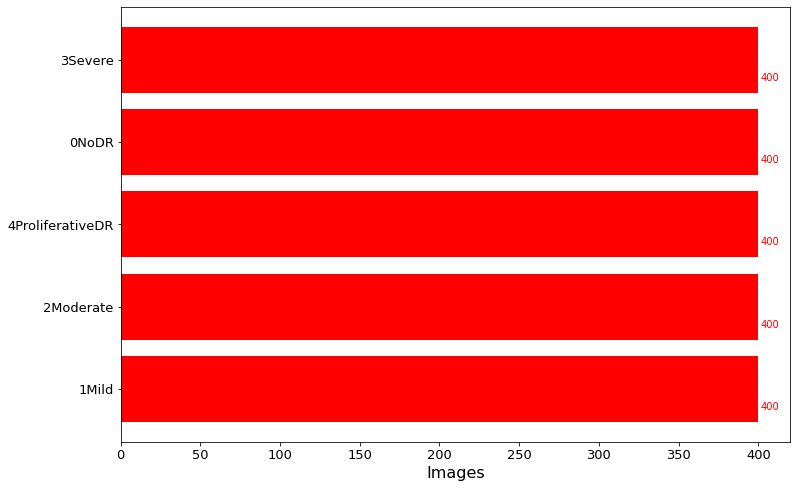

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= validation_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "red" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

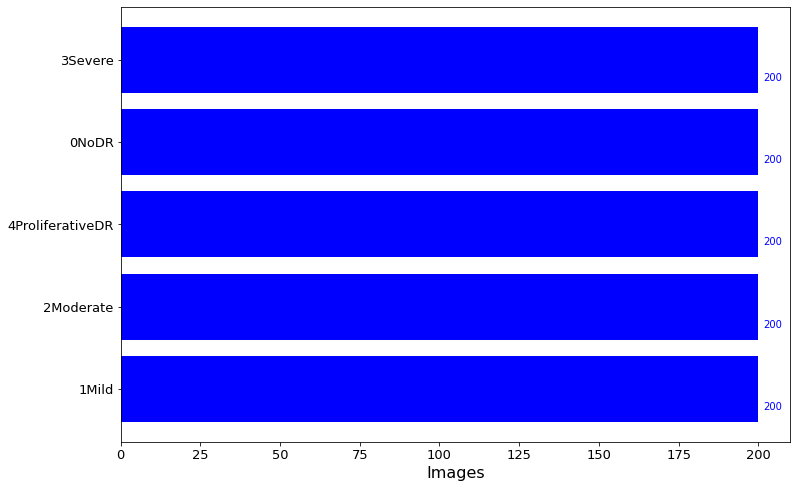

In [ ]:
# Melihat distribusi data dan plotting gambar dari folder train

main= test_dir

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "blue" for x in values] # Bagannya akan berubah menjadi merah jika jumlah data kurang dari 150
fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

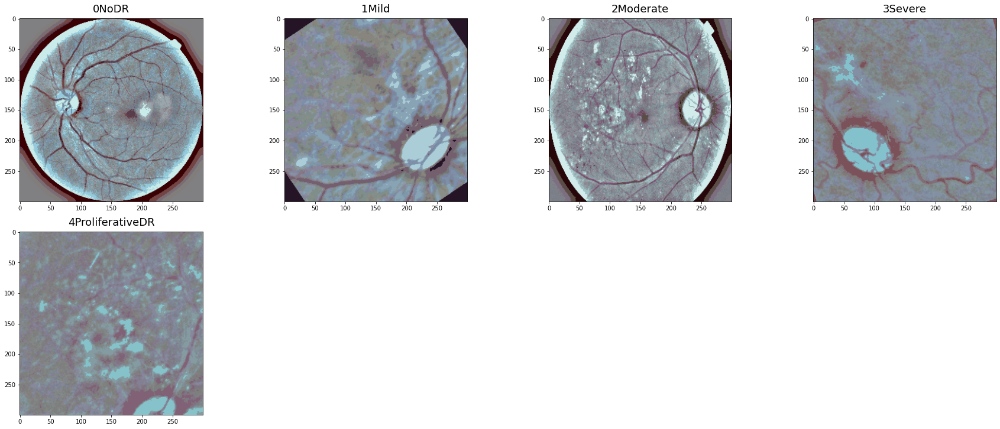

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for food_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap food folder yang didefinisikan sebagai train folder
    food_items = os.listdir(train_folder + '/' + food_folder) # Masukkan food items
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder,food_folder,food_selected))

# Melakukan Plotting dan visualisasi gambar     

fig=plt.figure(1, figsize=(25, 25)) 

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import preprocess_input
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=True,
                             shear_range = 0.2,
                             fill_mode = 'nearest',
                             preprocessing_function=preprocess_input)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)

test_datagen= ImageDataGenerator(rescale=1./255,
                                 rotation_range=20,
                                 horizontal_flip=True,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 preprocessing_function=preprocess_input)
                                   
train_data = datagen.flow_from_directory(train_dir,
                                         target_size=(IMG_HEIGHT,IMG_WIDTH),
                                         batch_size=BATCH_SIZE,
                                         shuffle=True,
                                         class_mode = 'categorical')

val_data = val_datagen.flow_from_directory(validation_dir,
                                          target_size=(IMG_HEIGHT,IMG_WIDTH),
                                          batch_size=BATCH_SIZE,
                                          shuffle=False,
                                          class_mode = 'categorical')

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(IMG_HEIGHT,IMG_WIDTH),
                                             batch_size=BATCH_SIZE,
                                             shuffle=False,
                                             class_mode = 'categorical')

Found 7000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [ ]:
class_name = train_data.class_indices
print(class_name)

{'0NoDR': 0, '1Mild': 1, '2Moderate': 2, '3Severe': 3, '4ProliferativeDR': 4}


In [ ]:
!pip install -q efficientnet

     |████████████████████████████████| 50 kB 7.6 MB/s 


In [ ]:
import efficientnet.tfkeras as ef

In [ ]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential 

model_ef = Sequential([
                       ef.EfficientNetB7(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), weights="imagenet", include_top=False) # Masukkan transfer learning dan masukkan inputshape sesuai dengan ukuran gambar serta bobot ImageNet
], name="base_model")

model_ef_custom = Sequential([ # Gunakan model sequential yang telah diimport di tensorflow
        model_ef,         # Masukkan model dasar tadi
        BatchNormalization(), 
        GlobalAveragePooling2D(), 
        Dense(128, activation = 'relu'),   # Fully connected layer Dense 128 filter layout dengan aktivasi relu
        Dropout(0.5),                      # Gunakan dropout sebanyak 0.2 untuk mitigasi overfitting
        Dense(5, activation="softmax")    # Masukkan sesuai class yang digunakan disini kami memiliki 15 class 
        ], name = "custom_eff_model")


258449408/258434480 [==============================] - 1s 0us/step


In [ ]:
model_ef_custom.summary()

Model: "custom_eff_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (Sequential)     (None, 7, 7, 2560)        64097680  
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 2560)       10240     
 ormalization)                                                   
                                                                 
 global_average_pooling2d (G  (None, 2560)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               327808    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)            

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.000001)
model_ef_custom.compile(optimizer= adam, 
                              loss= 'categorical_crossentropy', 
                              metrics=['accuracy'],
                               
                              )

In [ ]:
import time
start = time.time()
history = model_ef_custom.fit(     # Training data
    train_data,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=val_data,
    steps_per_epoch=train_data.n/BATCH_SIZE,
    validation_steps=test_data.n/BATCH_SIZE,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= EPOCHS,                      # Masukkan epoch sebanyak 30 kali
    verbose=1                            # Verbose
)
end = time.time()
print (end-start)

Epoch 1/90
388/388 [==============================] - 454s 1s/step - loss: 1.7396 - accuracy: 0.2110 - val_loss: 1.6835 - val_accuracy: 0.2460
Epoch 2/90
388/388 [==============================] - 412s 1s/step - loss: 1.6822 - accuracy: 0.2517 - val_loss: 1.5830 - val_accuracy: 0.3343
Epoch 3/90
388/388 [==============================] - 411s 1s/step - loss: 1.6337 - accuracy: 0.2780 - val_loss: 1.5271 - val_accuracy: 0.3621
Epoch 4/90
388/388 [==============================] - 410s 1s/step - loss: 1.6050 - accuracy: 0.2914 - val_loss: 1.4607 - val_accuracy: 0.3780
Epoch 5/90
388/388 [==============================] - 410s 1s/step - loss: 1.5886 - accuracy: 0.3100 - val_loss: 1.4180 - val_accuracy: 0.3839
Epoch 6/90
388/388 [==============================] - 412s 1s/step - loss: 1.5385 - accuracy: 0.3284 - val_loss: 1.3629 - val_accuracy: 0.4087
Epoch 7/90
388/388 [==============================] - 412s 1s/step - loss: 1.5191 - accuracy: 0.3403 - val_loss: 1.3019 - val_accuracy: 0.4415

ResourceExhaustedError: ignored

In [ ]:
def display_training_curves(training, validation, title, subplot):
    
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [ ]:
#display
display_training_curves(
    history.history['loss'], 
    history.history['val_loss'], 
    'loss', 211)
display_training_curves(
    history.history['accuracy'], 
    history.history['val_accuracy'], 
    'accuracy', 212)

In [ ]:
model_ef_custom.save('Model38bit_efficiennet.h5')

In [ ]:

def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #cm = np.around(cm, decimals=2)
        #cm[np.isnan(cm)] = 0.0
        #print("Normalized confusion matrix")
    #else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')
#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
#shuffle=False
target_names = []
for key in train_data.class_indices:
    target_names.append(key)
# print(target_names)
#Confution Matrix
Y_pred = model_ef_custom.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(test_data.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')
#Print Classification Report
print('Classification Report')
print(classification_report(test_data.classes, y_pred, target_names=target_names))